In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score as acc
#run pip install mlxtend in your terminal to install mlxtend
from mlxtend.feature_selection import SequentialFeatureSelector as sfs 
import statsmodels.api as sm
import statsmodels.formula.api as smf
from mlxtend.plotting import plot_sequential_feature_selection as plot_sfs

# Introduction

This study aims to investigate the relationship between the concentration of PM2.5 and atmospheric pollutants and the influence of meteorological conditions on PM2.5 concentration. Mathematical statistics methods were employed to analyze the data of PM2.5, atomspheric pollutants and meteorology in Changping ,Dongsi and Huairou District of Beijing, from March 2013 to February 2017. the bivariate correlation analysis showed that the PM2.5 concentration had a strong correlation with the concentrations of atmospheric pollutants such as PM10,SO2,NO2,O3,CO and the meteorological conditions such as PRES, WAPM. The fitting models we used OLS regression and feature Sequential Feature Selection forward method and gbm method for each season. After compared the value of R squared, we decided the model of PM2.5 concentration for each season use gbm method. --Mary

# Data Preparation

## Imputation of Missing Data (Do not run these, it will take forever) 

In [ ]:
# Import the three data sets and concatenate them
changping = pd.read_csv('/Users/Rocco/UCLA/Stats 131/Final Project/PRSA_Data_20130301-20170228/PRSA_Data_Changping_20130301-20170228.csv')
changping = changping.iloc[:,1:]
dongsi = pd.read_csv('/Users/Rocco/UCLA/Stats 131/Final Project/PRSA_Data_20130301-20170228/PRSA_Data_Dongsi_20130301-20170228.csv')
dongsi = dongsi.iloc[:,1:]
huairou = pd.read_csv('/Users/Rocco/UCLA/Stats 131/Final Project/PRSA_Data_20130301-20170228/PRSA_Data_Huairou_20130301-20170228.csv')
huairou = huairou.iloc[:,1:]
data = pd.concat([changping, dongsi, huairou], axis = 0)

In [ ]:
# Create a "date" column of the form of YYYY-MM-DD HH:MM:SS"
date = pd.to_datetime({"year":data.year,"month":data.month,"day":data.day,"hour":data.hour})
data['date'] = date

In [ ]:
# Reindex
data = data.reset_index(drop=True)

In [ ]:
data.head()

In [ ]:
data.tail()

In [ ]:
# to see if has na values
data.info()

In [ ]:
# export the merged csv file (before removing na) for future use
data.to_csv("data(hasna).csv",index = False)

In [ ]:
# create a list that contains the column name where has na
nanlistname = ['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']

In [ ]:
# define a function that cleans na
# input a column and replace na with the mean of the its two nearest neighbour
def fillna(columns):
    for c in columns:
        a = c.notnull()
        for i in range(0, data.shape[0]):
            #print(a[i])
            if a[i]==False:
                for k in range(i,data.shape[0]):
                    if a[k]==True:
                        c[i] = (c[i-1] + c[k])/2
                        break

In [ ]:
# fill na for 'wd' using previous non-na value
data['wd'].fillna(method = 'ffill',inplace = True )

In [ ]:
# fill na for the other columns that contain na
fillna([data['SO2'],data['PM2.5'],data['PM10'],data['CO'],data['NO2'],data['O3'],data['DEWP'],data['TEMP'],data['PRES'],data['WSPM'],data['RAIN']])

In [ ]:
# check if na's have been filled up
data.info()

In [ ]:
# export the non na csv file
data.to_csv("data(nona).csv",index = False)

**Now we have done the imputation of Missing Data. Starting from here, we will import `data(nona).csv` file everytime we launch the notebook (to save time)!**

In [2]:
# Import the no-na data file
data = pd.read_csv('/Users/Rocco/UCLA/Stats 131/Final Project/data(nona).csv')
wd = data.wd

In [3]:
data.head()

,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station,date
0,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping,2013-03-01 00:00:00
1,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping,2013-03-01 01:00:00
2,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping,2013-03-01 02:00:00
3,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping,2013-03-01 03:00:00
4,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping,2013-03-01 04:00:00


## One-Hot Encoding for `wd` variable
### Note `wd` is a categorical variables with multiple (16) levels, we need to convert it to dummy variables using One-Hot Encoding for future model fitting purpose.

In [4]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

In [5]:
wd_num = {
    'E':1,
    'ENE':2,
    'ESE':3,
    'N':4,
    'NE':5,
    'NNE':6,
    'NNW':7,
    'NW':8,
    'S':9,
    'SE' :10,
    'SSE':11,
    'SSW':12,
    'SW':13,
    'W':14,
    'WNW':15,
    'WSW':16,
}

In [6]:
wd_encoded=np.array([[wd_num.get(value)] for value in data.wd])
label_encoder = LabelEncoder()
onehot_encoder = OneHotEncoder(sparse=False)
wd_encoded = wd_encoded.reshape(len(wd_encoded), 1)
onehot_encoded = onehot_encoder.fit_transform(wd_encoded)

/Users/Rocco/opt/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)


In [7]:
encoded_wd = pd.DataFrame.from_records(onehot_encoded, columns=wd_num.keys())
encoded_wd

,E,ENE,ESE,N,NE,NNE,NNW,NW,S,SE,SSE,SSW,SW,W,WNW,WSW
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105187,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
105188,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
105189,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
105190,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
data=pd.concat([data.drop(['wd'], axis=1), encoded_wd, wd], axis=1)

In [9]:
# Set a multi index
data = data.set_index(['station','date'])

In [10]:
data.head()

year  month  day  hour  PM2.5  PM10   SO2  \
station   date                                                             
Changping 2013-03-01 00:00:00  2013      3    1     0    3.0   6.0  13.0   
          2013-03-01 01:00:00  2013      3    1     1    3.0   3.0   6.0   
          2013-03-01 02:00:00  2013      3    1     2    3.0   3.0  22.0   
          2013-03-01 03:00:00  2013      3    1     3    3.0   6.0  12.0   
          2013-03-01 04:00:00  2013      3    1     4    3.0   3.0  14.0   

                                NO2     CO    O3  ...   NW    S   SE  SSE  \
station   date                                    ...                       
Changping 2013-03-01 00:00:00   7.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 01:00:00   6.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 02:00:00  13.0  400.0  74.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 03:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 04:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   

                               SSW   SW    W  WNW  WSW   wd  
station   date                                               
Changping 2013-03-01 00:00:00  0.0  0.0  0.0  0.0  0.0    E  
          2013-03-01 01:00:00  0.0  0.0  0.0  0.0  0.0  ENE  
          2013-03-01 02:00:00  0.0  0.0  0.0  0.0  0.0  ENE  
          2013-03-01 03:00:00  0.0  0.0  0.0  0.0  0.0  NNE  
          2013-03-01 04:00:00  0.0  0.0  0.0  0.0  0.0    N  

[5 rows x 32 columns]

In [11]:
data.tail()

year  month  day  hour  PM2.5  PM10  SO2   NO2  \
station date                                                                  
Huairou 2017-02-28 19:00:00  2017      2   28    19   16.0  28.0  2.0  19.0   
        2017-02-28 20:00:00  2017      2   28    20   21.0  34.0  4.0  24.0   
        2017-02-28 21:00:00  2017      2   28    21   17.0  33.0  2.0  39.0   
        2017-02-28 22:00:00  2017      2   28    22   11.0  29.0  3.0  32.0   
        2017-02-28 23:00:00  2017      2   28    23   11.0  20.0  2.0  27.0   

                                 CO    O3  ...   NW    S   SE  SSE  SSW   SW  \
station date                               ...                                 
Huairou 2017-02-28 19:00:00   300.0  95.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 20:00:00   500.0  80.0  ...  0.0  0.0  0.0  0.0  1.0  0.0   
        2017-02-28 21:00:00   900.0  60.0  ...  0.0  0.0  1.0  0.0  0.0  0.0   
        2017-02-28 22:00:00  1400.0  69.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 23:00:00   400.0  77.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   

                               W  WNW  WSW   wd  
station date                                     
Huairou 2017-02-28 19:00:00  0.0  1.0  0.0  WNW  
        2017-02-28 20:00:00  0.0  0.0  0.0  SSW  
        2017-02-28 21:00:00  0.0  0.0  0.0   SE  
        2017-02-28 22:00:00  0.0  0.0  0.0  ENE  
        2017-02-28 23:00:00  0.0  0.0  0.0   NE  

[5 rows x 32 columns]

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 105192 entries, (Changping, 2013-03-01 00:00:00) to (Huairou, 2017-02-28 23:00:00)
Data columns (total 32 columns):
year     105192 non-null int64
month    105192 non-null int64
day      105192 non-null int64
hour     105192 non-null int64
PM2.5    105192 non-null float64
PM10     105192 non-null float64
SO2      105192 non-null float64
NO2      105192 non-null float64
CO       105192 non-null float64
O3       105192 non-null float64
TEMP     105192 non-null float64
PRES     105192 non-null float64
DEWP     105192 non-null float64
RAIN     105192 non-null float64
WSPM     105192 non-null float64
E        105192 non-null float64
ENE      105192 non-null float64
ESE      105192 non-null float64
N        105192 non-null float64
NE       105192 non-null float64
NNE      105192 non-null float64
NNW      105192 non-null float64
NW       105192 non-null float64
S        105192 non-null float64
SE       105192 non-null float64
SSE      105192 n

In [13]:
# check the dimension of the data sets for each station
print(data.loc['Changping'].shape)
print(data.loc['Dongsi'].shape)
print(data.loc['Huairou'].shape)

(35064, 32)
(35064, 32)
(35064, 32)


In [14]:
# select via the ounner then inner index
# data.loc[('Huairou', '2017-01-01 00:00:00'):('Huairou', '2017-01-31 23:00:00')]

## A new column for season

In [15]:
# define a dictionary for season
s = {
1: 'Winter', 
2: 'Winter', 
3: 'Spring',
4: 'Spring',
5: 'Spring',
6: 'Summer',
7: 'Summer',
8: 'Summer',
9: 'Fall',
10: 'Fall',
11: 'Fall',
12: 'Winter'}

In [16]:
# add a 'season' column that indicates season
data["season"]=[s.get(value) for value in data.month]

In [17]:
data.head()

year  month  day  hour  PM2.5  PM10   SO2  \
station   date                                                             
Changping 2013-03-01 00:00:00  2013      3    1     0    3.0   6.0  13.0   
          2013-03-01 01:00:00  2013      3    1     1    3.0   3.0   6.0   
          2013-03-01 02:00:00  2013      3    1     2    3.0   3.0  22.0   
          2013-03-01 03:00:00  2013      3    1     3    3.0   6.0  12.0   
          2013-03-01 04:00:00  2013      3    1     4    3.0   3.0  14.0   

                                NO2     CO    O3  ...    S   SE  SSE  SSW  \
station   date                                    ...                       
Changping 2013-03-01 00:00:00   7.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 01:00:00   6.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 02:00:00  13.0  400.0  74.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 03:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 04:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   

                                SW    W  WNW  WSW   wd  season  
station   date                                                  
Changping 2013-03-01 00:00:00  0.0  0.0  0.0  0.0    E  Spring  
          2013-03-01 01:00:00  0.0  0.0  0.0  0.0  ENE  Spring  
          2013-03-01 02:00:00  0.0  0.0  0.0  0.0  ENE  Spring  
          2013-03-01 03:00:00  0.0  0.0  0.0  0.0  NNE  Spring  
          2013-03-01 04:00:00  0.0  0.0  0.0  0.0    N  Spring  

[5 rows x 33 columns]

In [18]:
data.tail()

year  month  day  hour  PM2.5  PM10  SO2   NO2  \
station date                                                                  
Huairou 2017-02-28 19:00:00  2017      2   28    19   16.0  28.0  2.0  19.0   
        2017-02-28 20:00:00  2017      2   28    20   21.0  34.0  4.0  24.0   
        2017-02-28 21:00:00  2017      2   28    21   17.0  33.0  2.0  39.0   
        2017-02-28 22:00:00  2017      2   28    22   11.0  29.0  3.0  32.0   
        2017-02-28 23:00:00  2017      2   28    23   11.0  20.0  2.0  27.0   

                                 CO    O3  ...    S   SE  SSE  SSW   SW    W  \
station date                               ...                                 
Huairou 2017-02-28 19:00:00   300.0  95.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 20:00:00   500.0  80.0  ...  0.0  0.0  0.0  1.0  0.0  0.0   
        2017-02-28 21:00:00   900.0  60.0  ...  0.0  1.0  0.0  0.0  0.0  0.0   
        2017-02-28 22:00:00  1400.0  69.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 23:00:00   400.0  77.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   

                             WNW  WSW   wd  season  
station date                                        
Huairou 2017-02-28 19:00:00  1.0  0.0  WNW  Winter  
        2017-02-28 20:00:00  0.0  0.0  SSW  Winter  
        2017-02-28 21:00:00  0.0  0.0   SE  Winter  
        2017-02-28 22:00:00  0.0  0.0  ENE  Winter  
        2017-02-28 23:00:00  0.0  0.0   NE  Winter  

[5 rows x 33 columns]

## Another column for seasonal year
Since Winter spans two years, we need to define a "seasonal year" column that indicates correct corresponding year for each season.

Note our data is from 2013-03-01 to 2017-02-28, and we have Spring (2013, 2014, 2015, 2016), Summer (2013, 2014, 2015, 2016), Fall (2013, 2014, 2015, 2016), and Winter (2013, 2014, 2015, 2016). Thus, we will consider the date from 2013-12 to 2014-02 as 2013 winter, etc.

In [19]:
# concatenate year and month columns
yearmonth = data[['year', 'month']].astype(str).apply(lambda x: ''.join(x), axis=1).astype(int)
yearmonth

station    date               
Changping  2013-03-01 00:00:00    20133
           2013-03-01 01:00:00    20133
           2013-03-01 02:00:00    20133
           2013-03-01 03:00:00    20133
           2013-03-01 04:00:00    20133
                                  ...  
Huairou    2017-02-28 19:00:00    20172
           2017-02-28 20:00:00    20172
           2017-02-28 21:00:00    20172
           2017-02-28 22:00:00    20172
           2017-02-28 23:00:00    20172
Length: 105192, dtype: int64

In [20]:
# define a dictionary for seasonal year
seasonal_year = {
    20133: 2013, 20143: 2014, 20153: 2015, 20163: 2016, 
    20134: 2013, 20144: 2014, 20154: 2015, 20164: 2016, 
    20135: 2013, 20145: 2014, 20155: 2015, 20165: 2016, 
    20136: 2013, 20146: 2014, 20156: 2015, 20166: 2016, 
    20137: 2013, 20147: 2014, 20157: 2015, 20167: 2016, 
    20138: 2013, 20148: 2014, 20158: 2015, 20167: 2016, 
    20139: 2013, 20149: 2014, 20159: 2015, 20169: 2016, 
    201310: 2013, 201410: 2014, 201510: 2015, 201610: 2016, 
    201311: 2013, 201411: 2014, 201511: 2015, 201611: 2016, 
    201312: 2013, 201412: 2014, 201512: 2015, 201612: 2016, 
    20141: 2013, 20151: 2014, 20161: 2015, 20171: 2016, 
    20142: 2013, 20152: 2014, 20162: 2015, 20172: 2016
}

In [21]:
data["seasonal year"]=[seasonal_year.get(value) for value in yearmonth]

In [22]:
data.head()

year  month  day  hour  PM2.5  PM10   SO2  \
station   date                                                             
Changping 2013-03-01 00:00:00  2013      3    1     0    3.0   6.0  13.0   
          2013-03-01 01:00:00  2013      3    1     1    3.0   3.0   6.0   
          2013-03-01 02:00:00  2013      3    1     2    3.0   3.0  22.0   
          2013-03-01 03:00:00  2013      3    1     3    3.0   6.0  12.0   
          2013-03-01 04:00:00  2013      3    1     4    3.0   3.0  14.0   

                                NO2     CO    O3  ...   SE  SSE  SSW   SW  \
station   date                                    ...                       
Changping 2013-03-01 00:00:00   7.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 01:00:00   6.0  300.0  85.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 02:00:00  13.0  400.0  74.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 03:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   
          2013-03-01 04:00:00   8.0  300.0  81.0  ...  0.0  0.0  0.0  0.0   

                                 W  WNW  WSW   wd  season  seasonal year  
station   date                                                            
Changping 2013-03-01 00:00:00  0.0  0.0  0.0    E  Spring         2013.0  
          2013-03-01 01:00:00  0.0  0.0  0.0  ENE  Spring         2013.0  
          2013-03-01 02:00:00  0.0  0.0  0.0  ENE  Spring         2013.0  
          2013-03-01 03:00:00  0.0  0.0  0.0  NNE  Spring         2013.0  
          2013-03-01 04:00:00  0.0  0.0  0.0    N  Spring         2013.0  

[5 rows x 34 columns]

In [23]:
data.tail()

year  month  day  hour  PM2.5  PM10  SO2   NO2  \
station date                                                                  
Huairou 2017-02-28 19:00:00  2017      2   28    19   16.0  28.0  2.0  19.0   
        2017-02-28 20:00:00  2017      2   28    20   21.0  34.0  4.0  24.0   
        2017-02-28 21:00:00  2017      2   28    21   17.0  33.0  2.0  39.0   
        2017-02-28 22:00:00  2017      2   28    22   11.0  29.0  3.0  32.0   
        2017-02-28 23:00:00  2017      2   28    23   11.0  20.0  2.0  27.0   

                                 CO    O3  ...   SE  SSE  SSW   SW    W  WNW  \
station date                               ...                                 
Huairou 2017-02-28 19:00:00   300.0  95.0  ...  0.0  0.0  0.0  0.0  0.0  1.0   
        2017-02-28 20:00:00   500.0  80.0  ...  0.0  0.0  1.0  0.0  0.0  0.0   
        2017-02-28 21:00:00   900.0  60.0  ...  1.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 22:00:00  1400.0  69.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   
        2017-02-28 23:00:00   400.0  77.0  ...  0.0  0.0  0.0  0.0  0.0  0.0   

                             WSW   wd  season  seasonal year  
station date                                                  
Huairou 2017-02-28 19:00:00  0.0  WNW  Winter         2016.0  
        2017-02-28 20:00:00  0.0  SSW  Winter         2016.0  
        2017-02-28 21:00:00  0.0   SE  Winter         2016.0  
        2017-02-28 22:00:00  0.0  ENE  Winter         2016.0  
        2017-02-28 23:00:00  0.0   NE  Winter         2016.0  

[5 rows x 34 columns]

**So far, we have done data cleaning and manuplication.**

# Data Exploration

## We start to explore the seasonal change in each pollutant for each station in each seasonal year.

In [24]:
# Find seasonal mean of each variable for each station in each year
seasonmean = data.iloc[:,4:].groupby(["station","seasonal year","season"], sort=False).mean().unstack()
seasonmean

PM2.5                                    \
season                      Spring     Summer       Fall      Winter   
station   seasonal year                                                
Changping 2013.0         80.655344  65.964624  72.303571   98.583527   
          2014.0         80.520652  59.997652  85.599124   77.857936   
          2015.0         64.533047  51.061821  57.959657   71.895375   
          2016.0         60.327729  53.886228  70.250344   90.147454   
Dongsi    2013.0         88.608582  81.326285  90.847985  113.620515   
          2014.0         84.381692  75.524434  89.077953   87.091223   
          2015.0         77.574649  61.578663  86.430503   92.311126   
          2016.0         79.700449  71.000683  87.081638  118.470209   
Huairou   2013.0         72.830389  64.213315  68.394918   97.323942   
          2014.0         75.157484  64.433316  74.853911   68.070584   
          2015.0         69.569497  47.971213  67.677470   75.843907   
          2016.0         62.889832  52.605277  68.694598   79.862963   

                               PM10                                     \
season                       Spring     Summer        Fall      Winter   
station   seasonal year                                                  
Changping 2013.0         110.808650  77.973053   88.198947  112.591462   
          2014.0         123.715127  80.222763  112.249542  106.426397   
          2015.0         110.631459  66.254734   68.917518   96.192508   
          2016.0         103.874490  67.644168   91.379923  104.987384   
Dongsi    2013.0         120.952899  92.131708  102.716461  118.380176   
          2014.0         133.648007  85.953284  129.537592  114.761779   
          2015.0         128.750181  77.945867  102.821300  107.937729   
          2016.0         115.161618  78.721995  109.692659  151.137182   
Huairou   2013.0         124.012455  91.786458   87.448260  105.916650   
          2014.0         113.197124  84.182694   95.504609   91.079928   
          2015.0         107.627451  63.544554   76.798063   83.412717   
          2016.0         101.728884  67.916987   88.613668   98.275694   

                               SO2             ...         W            \
season                      Spring     Summer  ...      Fall    Winter   
station   seasonal year                        ...                       
Changping 2013.0         25.097358   9.153538  ...  0.016941  0.051389   
          2014.0         21.126902   5.153616  ...  0.036630  0.073148   
          2015.0         11.038901   3.880898  ...  0.090201  0.054029   
          2016.0          8.745138   3.498196  ...  0.031593  0.022222   
Dongsi    2013.0         31.407160  12.892948  ...  0.028388  0.026389   
          2014.0         25.479303   8.374615  ...  0.038462  0.038426   
          2015.0         15.793014   5.860168  ...  0.031593  0.026099   
          2016.0         13.683018   5.363900  ...  0.020604  0.019907   
Huairou   2013.0         32.893011   6.448759  ...  0.098901  0.087500   
          2014.0         17.776834   4.431046  ...  0.051740  0.057870   
          2015.0          9.320148   4.061424  ...  0.040751  0.054487   
          2016.0          8.823483   3.901895  ...  0.048993  0.031481   

                              WNW                                     WSW  \
season                     Spring    Summer      Fall    Winter    Spring   
station   seasonal year                                                     
Changping 2013.0         0.027174  0.037138  0.072344  0.114352  0.018116   
          2014.0         0.071558  0.042120  0.074634  0.161111  0.020380   
          2015.0         0.071558  0.062500  0.100733  0.184524  0.014040   
          2016.0         0.096920  0.038934  0.074634  0.091667  0.010870   
Dongsi    2013.0         0.038043  0.033062  0.062729  0.046296  0.052989   
          2014.0         0.037591  0.019475  0.035714  0.053704  0.062953   
          2015.0         0.033062

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

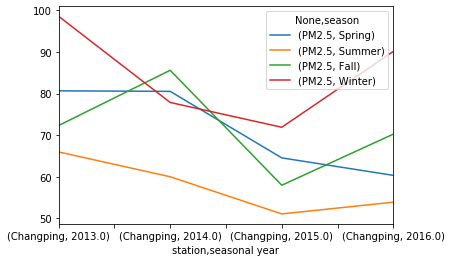

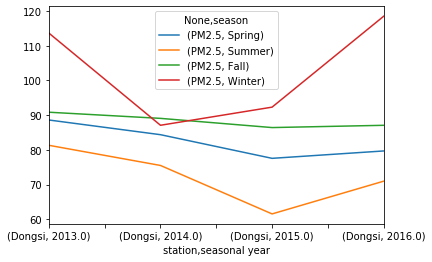

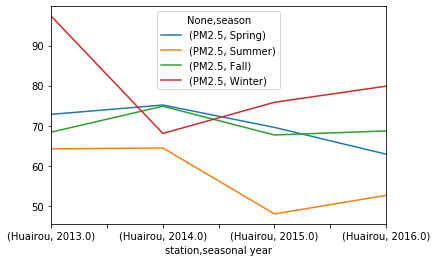

In [25]:
# plot the chage in PM2.5
seasonmean[["PM2.5"]].groupby("station").plot()

**As we can see from above graphs, in each station, overall, Winter PM2.5 level is higher than other seasons except for year 2014, and Summer PM2.5 level is always lower than other seasons. Furthermore, the level of PM 2.5 in each station has an overall dereasing trend in the first 3 years but rebounds up a little bit in 2016.**

**Let's look at changes in other pollutants.**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

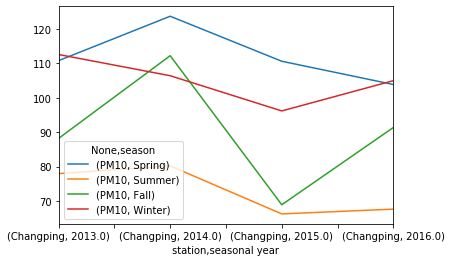

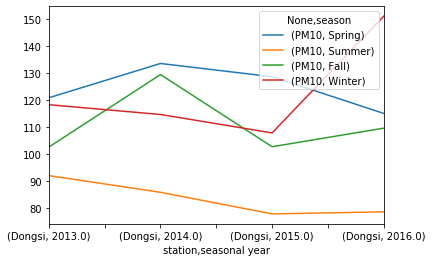

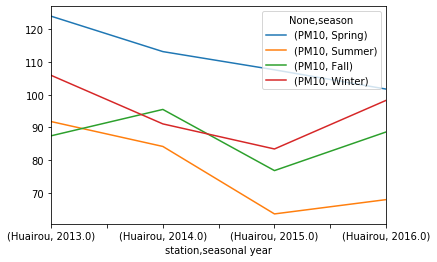

In [26]:
seasonmean[['PM10']].groupby("station").plot()

**Surprisingly, for PM10, Spring is the worst. This might be due to pollination in spring. Since we are more concerned about the air pollution from fine inhalable particles (PM2.5) and PM10 is confounded with PM2.5, thus we will disregard PM10 from now on.**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

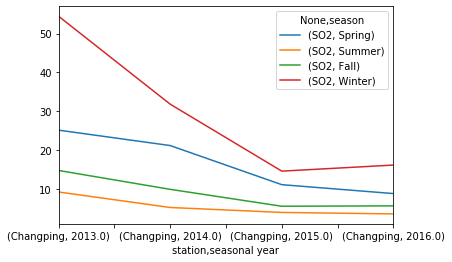

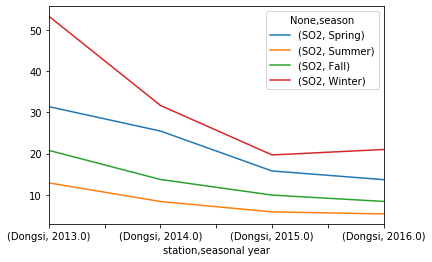

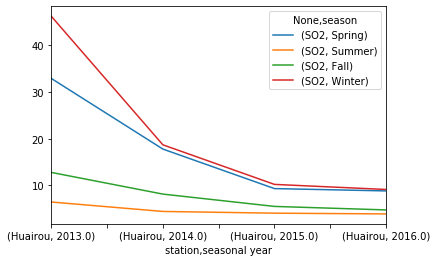

In [27]:
seasonmean[['SO2']].groupby("station").plot()

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

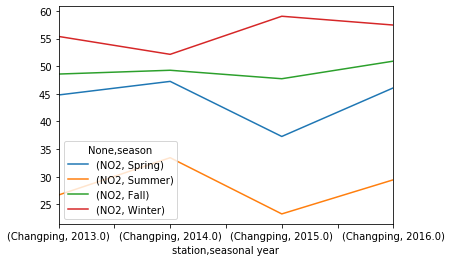

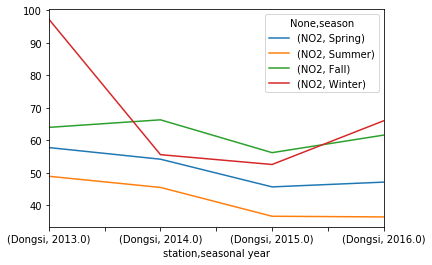

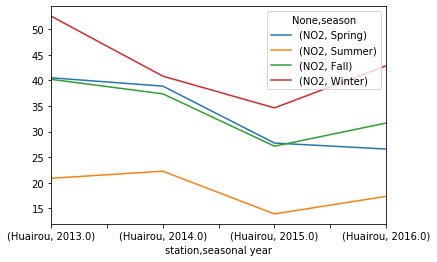

In [28]:
seasonmean[['NO2']].groupby("station").plot()

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

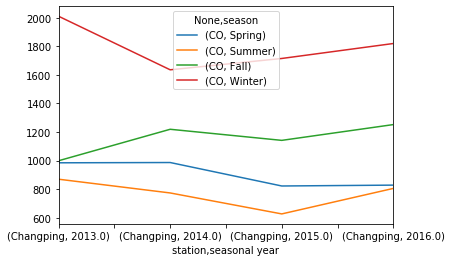

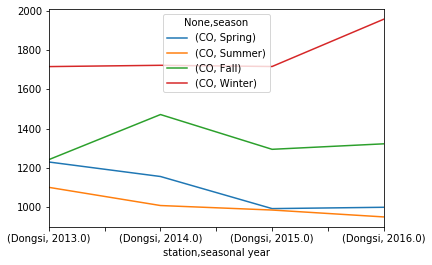

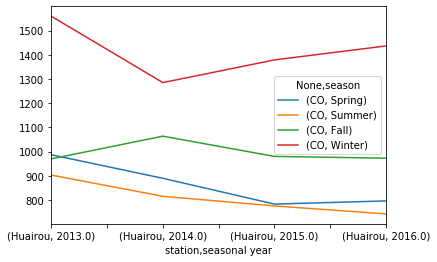

In [29]:
seasonmean[['CO']].groupby("station").plot()

**For SO2, NO2 and CO, the seasonal trends match that of PM2.5, that is, overall, Winter has high level of pollutants than any other seasons and Summer has low level of pollutants than other seasons. Also notice that, overall, SO2 is decreasing over year**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

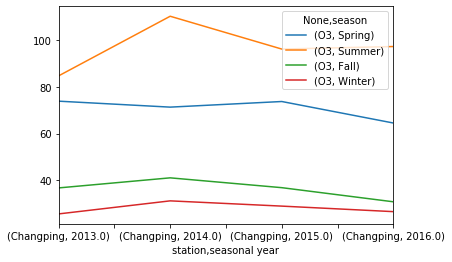

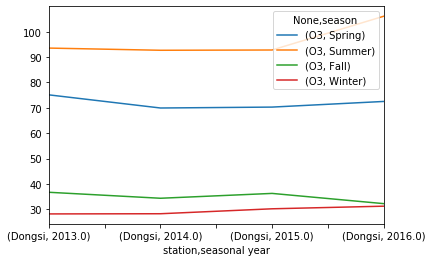

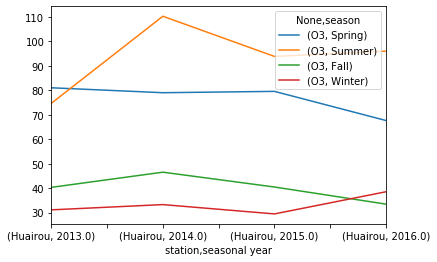

In [30]:
seasonmean[['O3']].groupby("station").plot()

**For O3, the results are just reversed, which makes sense since ozone has the highest concentration in summer and lowest in winter.**

## Next, let's find the seasonal change in each meteorological condition for each station in each seasonal year.

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

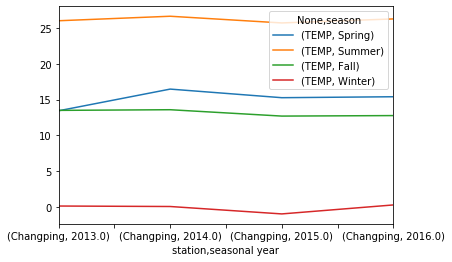

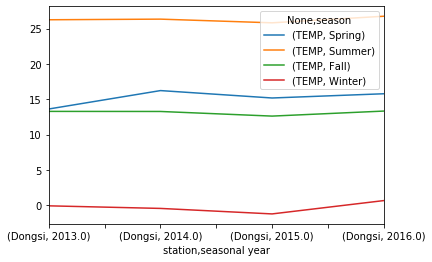

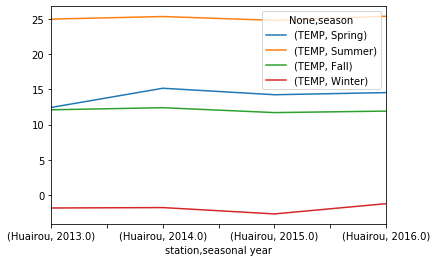

In [31]:
seasonmean[['TEMP']].groupby("station").plot()

**We can see from above plots, the temp trends to seasonal, summer has high temp and winter has low temp in Beijing.** *`temp` has negative relationship with `PM2.5` How can you tell?* .

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

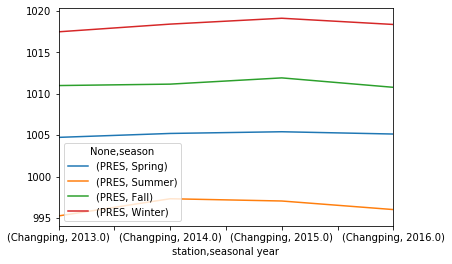

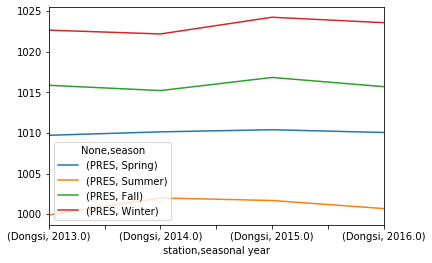

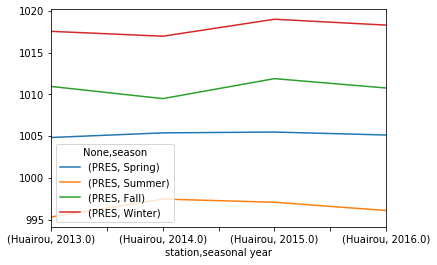

In [32]:
seasonmean[['PRES']].groupby("station").plot()

**`pressure` plots show that summer is low and winter is high in Beijing. And Dongsi has overall high pressure than the other two regions.**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

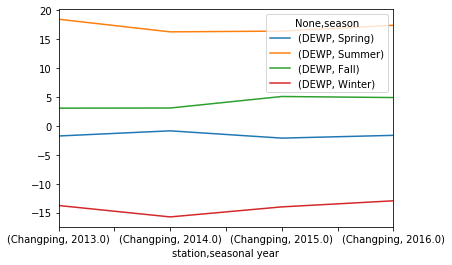

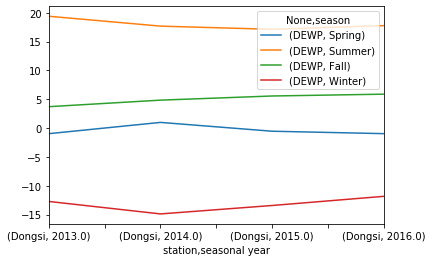

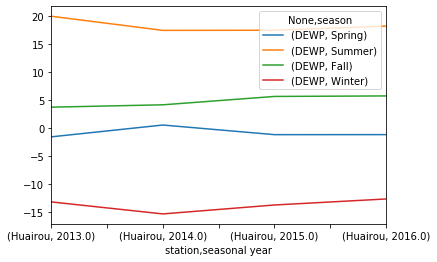

In [33]:
seasonmean[['DEWP']].groupby("station").plot()

**`DEWP` is high in summer and low in winter in Beijing. For each station, `DEWP` has similar trend in each season which indicates that `DEWP` is consistent in Beijing.**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

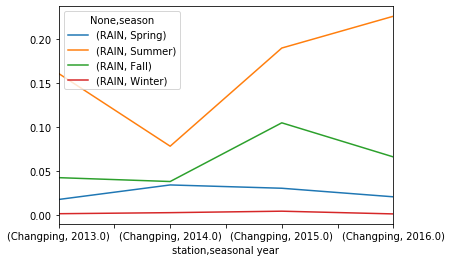

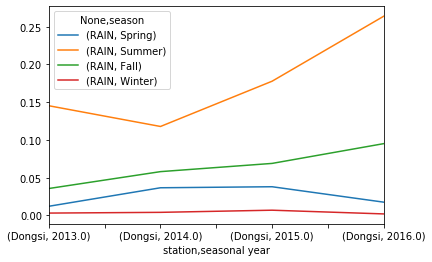

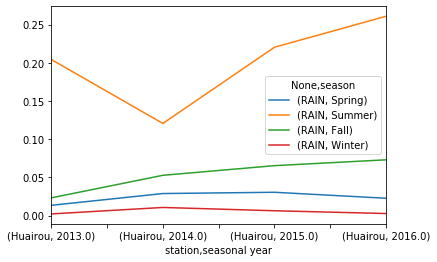

In [34]:
seasonmean[['RAIN']].groupby("station").plot()

**We can see that `RAIN` is high in summer and low in winter in Beijing, but we can see that the rain in summer in 2014 is much lower than any others in summer.**

station
Changping    AxesSubplot(0.125,0.125;0.775x0.755)
Dongsi       AxesSubplot(0.125,0.125;0.775x0.755)
Huairou      AxesSubplot(0.125,0.125;0.775x0.755)
dtype: object

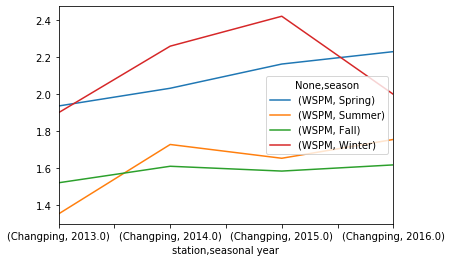

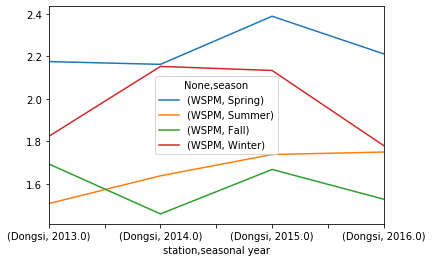

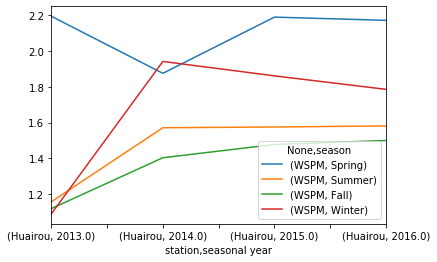

In [35]:
seasonmean[['WSPM']].groupby("station").plot()

**`WSPM` varies over year but we can see that overall, Spring and Fall have stronger wind compared to Summer and Winter.**

## Now, we will look at the change in pollutants by station.

**Since we are only interested in seasonal change, we use the seaonal mean of each pollutant to analyze the data.**

In [36]:
stationmean = data.iloc[:,4:].groupby(["seasonal year","season","station"], sort=False).mean().unstack()
stationmean

PM2.5                               PM10  \
station               Changping      Dongsi    Huairou   Changping   
seasonal year season                                                 
2013.0        Spring  80.655344   88.608582  72.830389  110.808650   
              Summer  65.964624   81.326285  64.213315   77.973053   
              Fall    72.303571   90.847985  68.394918   88.198947   
              Winter  98.583527  113.620515  97.323942  112.591462   
2014.0        Spring  80.520652   84.381692  75.157484  123.715127   
              Summer  59.997652   75.524434  64.433316   80.222763   
              Fall    85.599124   89.077953  74.853911  112.249542   
              Winter  77.857936   87.091223  68.070584  106.426397   
2015.0        Spring  64.533047   77.574649  69.569497  110.631459   
              Summer  51.061821   61.578663  47.971213   66.254734   
              Fall    57.959657   86.430503  67.677470   68.917518   
              Winter  71.895375   92.311126  75.843907   96.192508   
2016.0        Spring  60.327729   79.700449  62.889832  103.874490   
              Summer  53.886228   71.000683  52.605277   67.644168   
              Fall    70.250344   87.081638  68.694598   91.379923   
              Winter  90.147454  118.470209  79.862963  104.987384   

                                                    SO2                        \
station                   Dongsi     Huairou  Changping     Dongsi    Huairou   
seasonal year season                                                            
2013.0        Spring  120.952899  124.012455  25.097358  31.407160  32.893011   
              Summer   92.131708   91.786458   9.153538  12.892948   6.448759   
              Fall    102.716461   87.448260  14.701292  20.784370  12.782472   
              Winter  118.380176  105.916650  54.466967  53.356790  46.197343   
2014.0        Spring  133.648007  113.197124  21.126902  25.479303  17.776834   
              Summer   85.953284   84.182694   5.153616   8.374615   4.431046   
              Fall    129.537592   95.504609   9.835053  13.727679   8.143315   
              Winter  114.761779   91.079928  31.794868  31.696115  18.688812   
2015.0        Spring  128.750181  107.627451  11.038901  15.793014   9.320148   
              Summer   77.945867   63.544554   3.880898   5.860168   4.061424   
              Fall    102.821300   76.798063   5.479904   9.934195   5.506296   
              Winter  107.937729   83.412717  14.529376  19.679144  10.217822   
2016.0        Spring  115.161618  101.728884   8.745138  13.683018   8.823483   
              Summer   78.721995   67.916987   3.498196   5.363900   3.901895   
              Fall    109.692659   88.613668   5.574523   8.398008   4.757212   
              Winter  151.137182   98.275694  16.092361  21.006163   9.130208   

                            NO2  ...        SW         W                      \
station               Changping  ...   Huairou Changping    Dongsi   Huairou   
seasonal year season             ...                                           
2013.0        Spring  44.784511  ...  0.070652  0.014946  0.028080  0.094203   
              Summer  26.687710  ...  0.059783  0.031703  0.025815  0.095562   
              Fall    48.568468  ...  0.036172  0.016941  0.028388  0.098901   
              Winter  55.375159  ...  0.054630  0.051389  0.026389  0.087500   
2014.0        Spring  47.241395  ...  0.063406  0.049819  0.034420  0.072464   
              Summer  33.432177  ...  0.059783  0.033062  0.033514  0.057518   
              Fall    49.254861  ...  0.038919  0.036630  0.038462  0.051740   
              Winter  52.135688  ...  0.022685  0.073148  0.038426  0.057870   
2015.0        Spring  37.277018  ...  0.057065  0.046196  0.032156  0.041667   
              Summer  23.262239  ...  0.061141  0.033967  0.023551  0.049819   
              Fall    47.721712  ...  0.049908  0.090201  0.031593  0.040751   
              Winter  59.028274  ..

### PM2.5 level in each stations

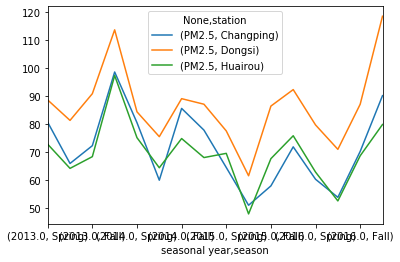

In [37]:
stationmean[['PM2.5']].plot()

**As we can see, Dongsi has much higer level of PM2.5 than the other two stations. This might be due to the fact that Dongsi is located at the center of Beijing, where has more cars and more pollutants.**

### What about SO2, NO2, and CO level in each stations?

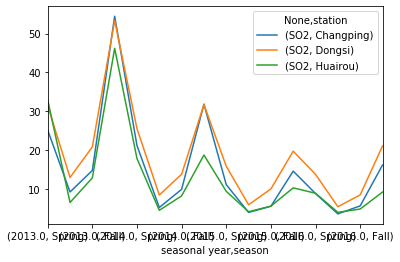

In [38]:
stationmean[['SO2']].plot()

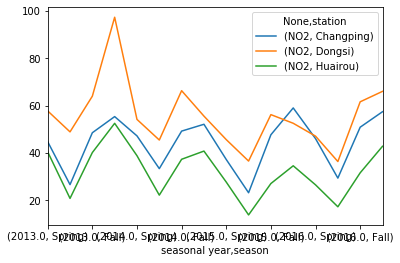

In [39]:
stationmean[['NO2']].plot()

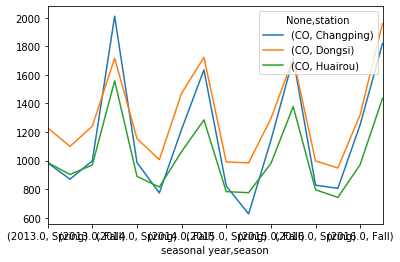

In [40]:
stationmean[['CO']].plot()

**These graphs verifies our guess that Dongsi has more pollutants than the other two due to its geographical location.**

## Let's briefly look at the trend in each pollutant over year and see if it's decreasing or not.

Text(0, 0.5, 'PM2.5')

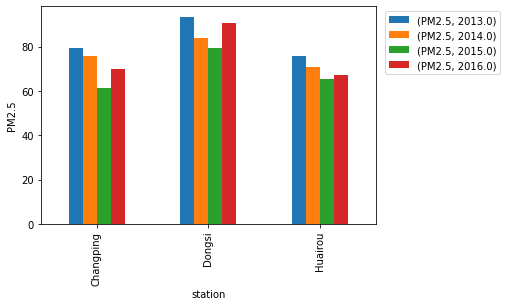

In [41]:
yearmean=data.groupby(["station","seasonal year"]).mean()[["PM2.5"]].unstack()
yearmean.plot(kind='bar')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))
plt.ylabel('PM2.5')

Text(0, 0.5, 'SO2')

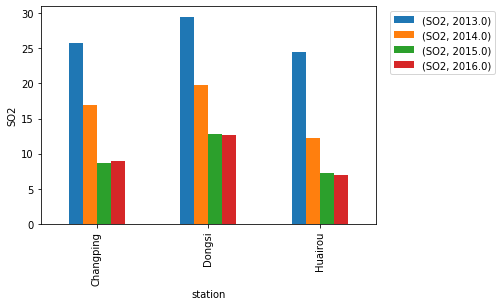

In [42]:
yearmean=data.groupby(["station","seasonal year"]).mean()[["SO2"]].unstack()
yearmean.plot(kind='bar')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))
plt.ylabel('SO2')

Text(0, 0.5, 'NO2')

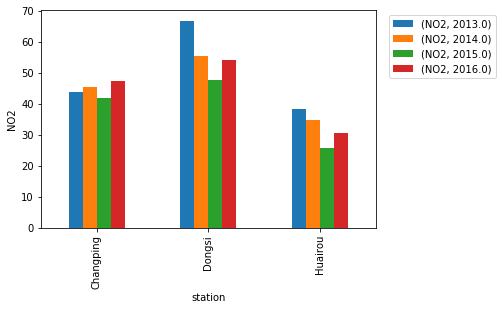

In [43]:
yearmean=data.groupby(["station","seasonal year"]).mean()[["NO2"]].unstack()
yearmean.plot(kind='bar')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))
plt.ylabel('NO2')

Text(0, 0.5, 'CO')

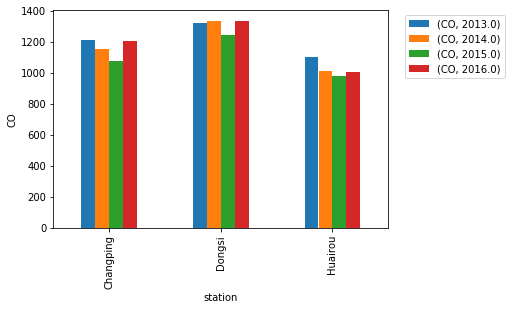

In [44]:
yearmean=data.groupby(["station","seasonal year"]).mean()[["CO"]].unstack()
yearmean.plot(kind='bar')
plt.legend(loc='upper center', bbox_to_anchor=(1.2, 1))
plt.ylabel('CO')

**As the bar plots show, PM2.5 level as well as other pollutant, overall, do decreae in year 2013 to 2015 but rebound up in 2016. (notes these are seasonal year)**

#  Variable Relationships Exploration

**First, let's seperate data into four seasons and begin by looking at the correlation plots for each season.**

In [45]:
spring = data.loc[data.season=="Spring"].rename(columns={'PM2.5':'PM2_5'})
summer = data.loc[data.season=="Summer"].rename(columns={'PM2.5':'PM2_5'})
fall = data.loc[data.season=="Fall"].rename(columns={'PM2.5':'PM2_5'})
winter = data.loc[data.season=="Winter"].rename(columns={'PM2.5':'PM2_5'})

### Pairplots (Do not run `sns.pairplot` below if your computer is slow)

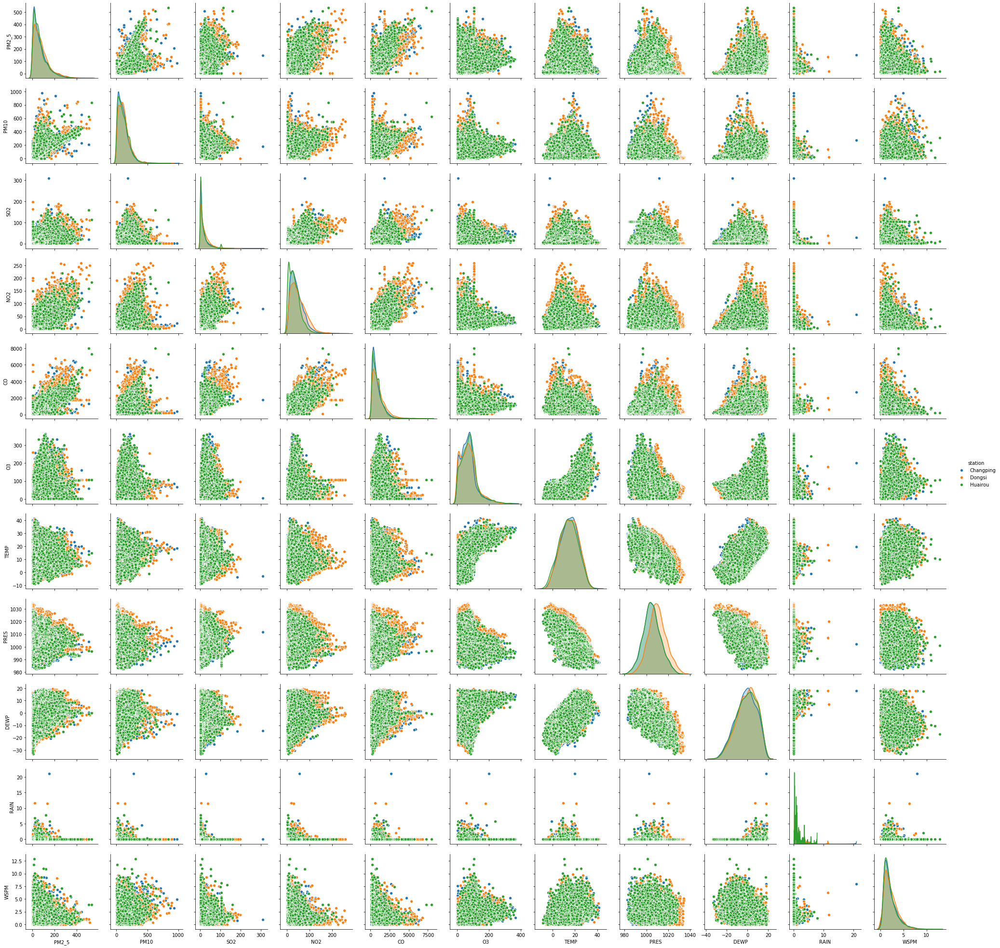

In [46]:
# pairplot for spring
sns.pairplot(spring.iloc[:,4:15].reset_index(level='station'), hue="station")

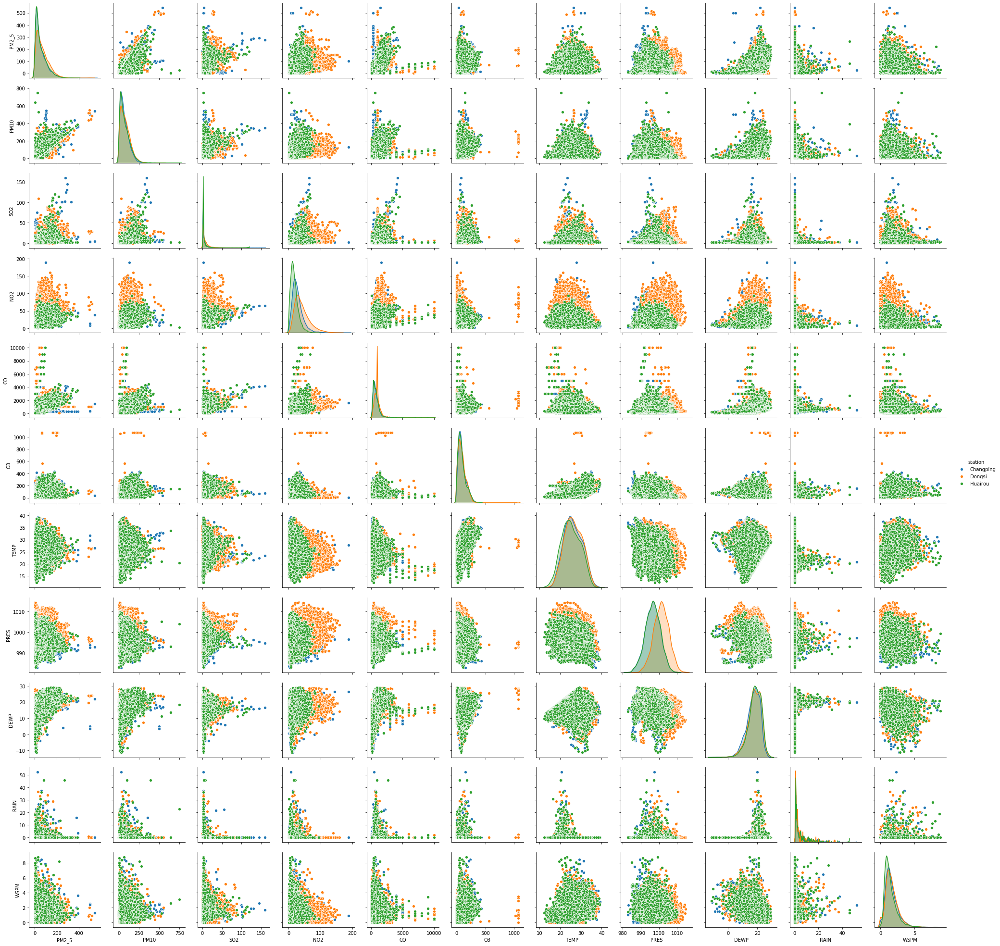

In [47]:
# pairplot for summer
sns.pairplot(summer.iloc[:,4:15].reset_index(level='station'), hue="station")

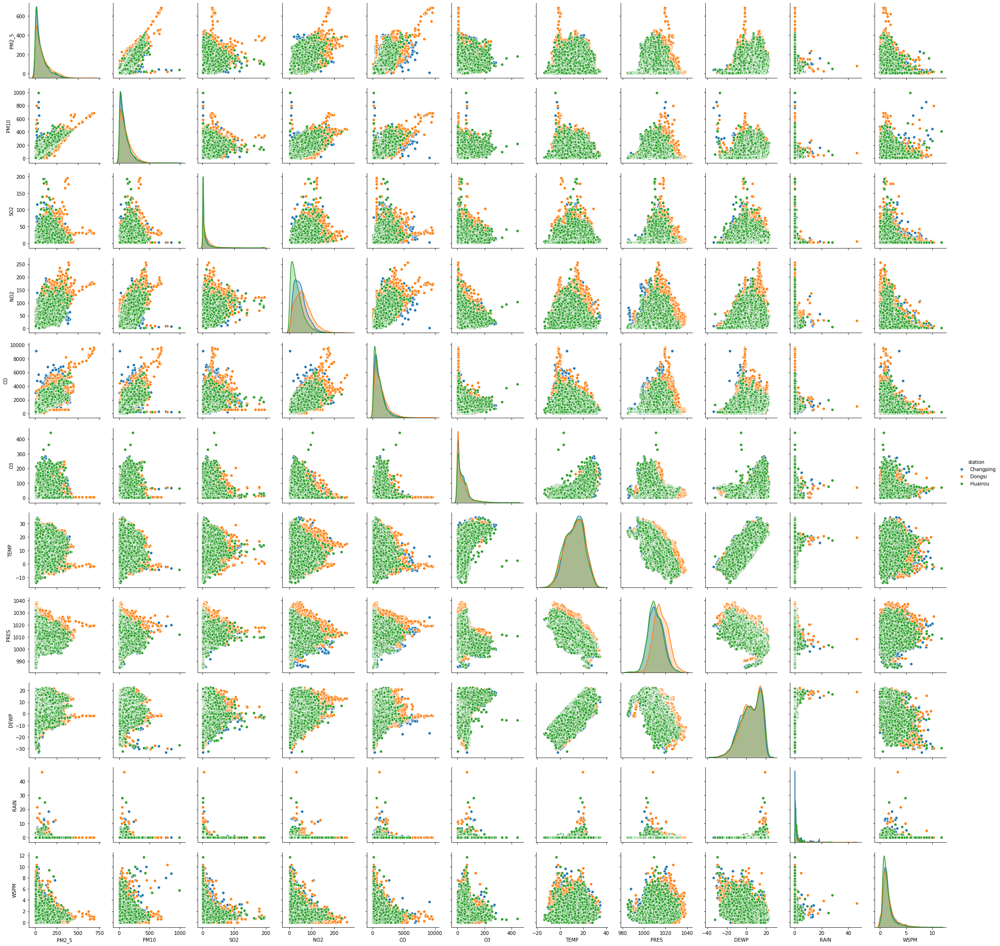

In [48]:
# pairplot for fall
sns.pairplot(fall.iloc[:,4:15].reset_index(level='station'), hue="station")

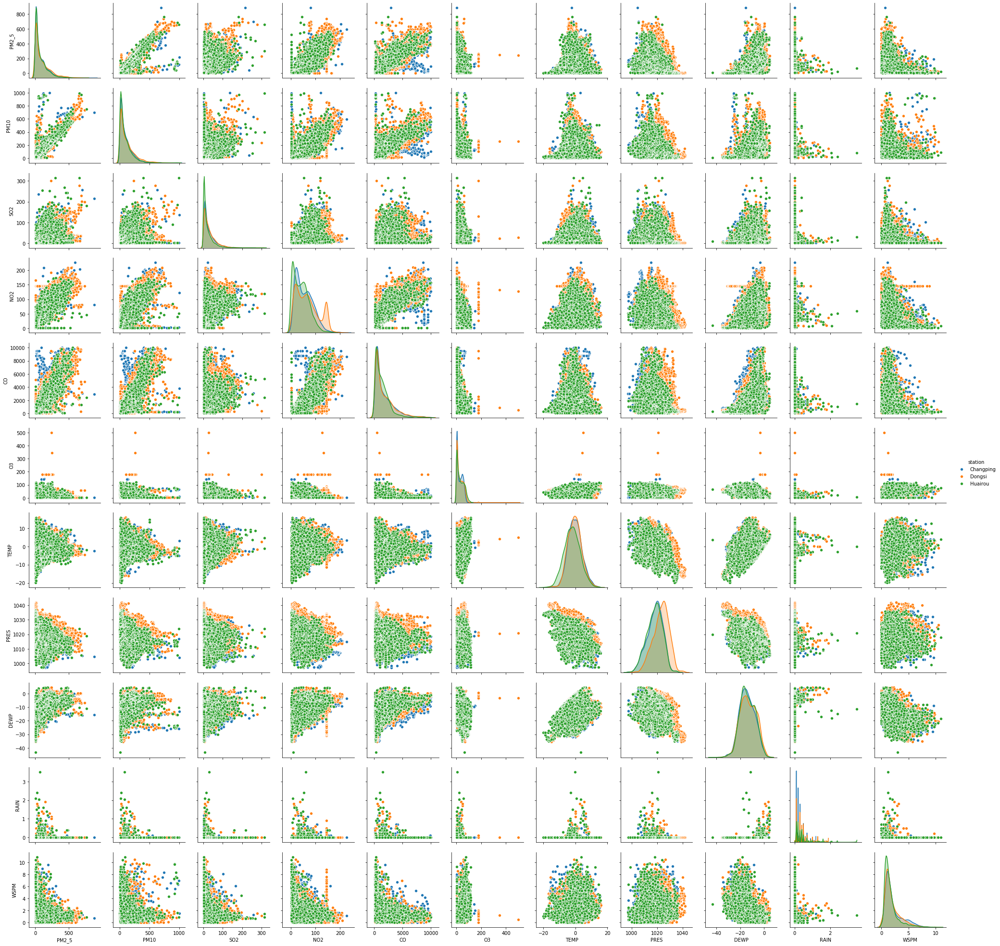

In [49]:
# pairplot for winter
sns.pairplot(winter.iloc[:,4:15].reset_index(level='station'), hue="station")

**Need some brief explaination here**

Note that there're a lot of scattered dots in "vertical" or "horizontal" pattern, this is due to missiing data we filled in.

### Let's look at the correlation between PM2.5 and the other variables for each station during each season.

In [50]:
corr_by_sta_seas = data.drop(['year','month','day','hour','seasonal year'], axis=1).groupby(["station","season"]).corr()

In [51]:
corr_by_sta_seas.loc['Changping'][['PM2.5']].unstack(0).iloc[1:11,:]

PM2.5                              
season      Fall    Spring    Summer    Winter
PM10    0.921551  0.735264  0.841275  0.918406
SO2     0.282360  0.586615  0.267836  0.510883
NO2     0.666793  0.626607  0.233472  0.816709
CO      0.707398  0.761008  0.605365  0.824717
O3     -0.069126  0.047388  0.172680 -0.578375
TEMP   -0.036949  0.012142  0.053590 -0.002240
PRES   -0.096560 -0.135232 -0.037387 -0.267922
DEWP    0.239069  0.382357  0.448877  0.634112
RAIN   -0.019687 -0.009253  0.016606  0.024920
WSPM   -0.271568 -0.250980 -0.064196 -0.422990

In [52]:
corr_by_sta_seas.loc['Dongsi'][['PM2.5']].unstack(0).iloc[1:11,:]

PM2.5                              
season      Fall    Spring    Summer    Winter
PM10    0.930421  0.738041  0.883716  0.947366
SO2     0.482897  0.627838  0.380398  0.595084
NO2     0.754154  0.651603  0.290598  0.670836
CO      0.796269  0.736529  0.460174  0.842768
O3     -0.125780 -0.071130  0.111629 -0.442939
TEMP   -0.090469 -0.043904  0.004773 -0.057028
PRES   -0.136853 -0.147483 -0.062090 -0.278295
DEWP    0.249597  0.357723  0.477459  0.647441
RAIN   -0.025655 -0.019747 -0.017312  0.009776
WSPM   -0.336423 -0.275606 -0.113547 -0.409859

In [53]:
corr_by_sta_seas.loc['Huairou'][['PM2.5']].unstack(0).iloc[1:11,:]

PM2.5                              
season      Fall    Spring    Summer    Winter
PM10    0.928473  0.769247  0.854081  0.915941
SO2     0.284108  0.378809  0.298769  0.434499
NO2     0.595318  0.637524  0.438904  0.769131
CO      0.813953  0.802015  0.622229  0.867832
O3      0.024087 -0.009785  0.220829 -0.477801
TEMP    0.008071 -0.038958  0.147556  0.060622
PRES   -0.115993 -0.112887 -0.048690 -0.240120
DEWP    0.256446  0.310279  0.447094  0.659185
RAIN   -0.023799 -0.019099  0.004945  0.013948
WSPM   -0.228311 -0.238697 -0.101686 -0.305902

**In each station during each season...**

PM10 is always highly correlated to PM2.5;

SO2 is relatively highly correlated to PM2.5 in Spring and Winter but weakly correlated in Summer and Fall;

NO2 is highly correlated to PM2.5 in Spring, Fall,and Winter, but weakly correlated in Summer;

CO is highly correlated to PM2.5 in Spring, Fall,and Winter, but relatively weakly correlated in Summer;

O3 does not seem highly correlated to PM2.5 but does has somewhat negative correlation between PM2.5 in Winter;

Among the five meteorological conditions, only the dew point in the winter seems highly correlated to PM2.5, all the others, such as temperature, pressure, dew point, precipitation and wind speed do not seem correleated to PM2.5 in any season.

# Model Analysis

## OLS Regression
**we begin to do OLS regression analysis and see what are statistically significant to  the change in PM2.5.**
**First, let's do forward feature selection to decide which features yield the best model in terms of $R^2$.**

### Feature Selection on `spring` data for each station.

8      0.63822
9     0.638208
10    0.638186
7     0.638122
11    0.638113
12    0.638026
13    0.637928
14    0.637764
15    0.637604
16    0.637524
6     0.637459
17    0.637367
18    0.637221
19    0.637072
20    0.636828
21     0.63656
22    0.636344
5     0.636002
23    0.635943
24    0.635943
4     0.633529
25    0.632906
3     0.618915
2     0.607229
1     0.549796
Name: avg_score, dtype: object


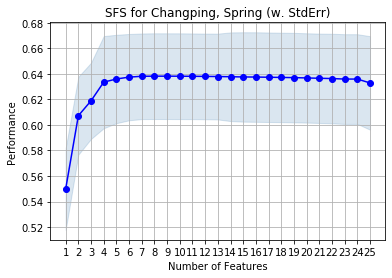

In [54]:
# Changping, Spring:
X = spring.loc['Changping'].values[:,6:31] # note we are excluding PM10
y = spring.loc['Changping'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Changping, Spring (w. StdErr)')
plt.grid()
plt.show()

15    0.616658
14    0.616657
16    0.616643
13    0.616591
17    0.616588
12     0.61654
11    0.616494
18    0.616464
19    0.616336
10    0.616249
20    0.616192
21    0.615878
9     0.615859
8     0.615279
22    0.615115
23    0.615115
7     0.614637
6     0.613988
24    0.613686
5     0.611139
25    0.610004
4       0.6091
3     0.577699
2     0.555206
1       0.5239
Name: avg_score, dtype: object


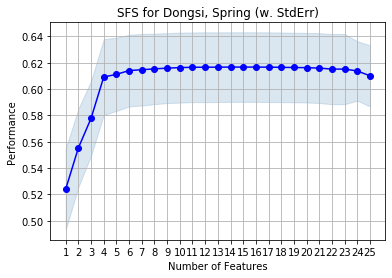

In [55]:
# Dongsi, Spring:
X = spring.loc['Dongsi'].values[:,6:31] # note we are excluding PM10
y = spring.loc['Dongsi'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Dongsi, Spring (w. StdErr)')
plt.grid()
plt.show()

12    0.657543
11    0.657528
13    0.657523
14    0.657471
15    0.657431
16    0.657376
10    0.657375
17    0.657314
18    0.657235
9     0.657171
19    0.657125
20    0.657023
21    0.656791
8     0.656768
22    0.656383
23    0.656383
7     0.656267
6     0.655641
24    0.655576
5     0.654652
4      0.65412
25    0.653356
3     0.646456
2     0.634939
1     0.626565
Name: avg_score, dtype: object


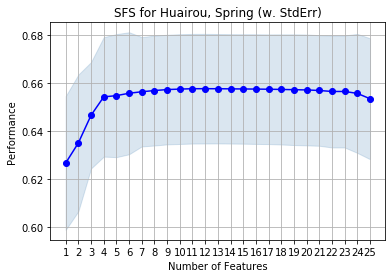

In [56]:
# Huairou, Spring:
X = spring.loc['Huairou'].values[:,6:31] # note we are excluding PM10
y = spring.loc['Huairou'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Huairou, Spring (w. StdErr)')
plt.grid()
plt.show()

### Feature Selection on `summer` data for each station.

12    0.388439
11    0.388362
13     0.38836
10    0.388257
14    0.388251
15    0.388103
9     0.387952
16    0.387935
17     0.38773
18    0.387534
8     0.387345
19    0.387202
20    0.387202
21     0.38657
7     0.386015
22    0.385297
6     0.384408
23    0.381469
5     0.376955
24    0.375527
25    0.370509
4     0.370404
3     0.355919
2      0.33751
1     0.310458
Name: avg_score, dtype: object


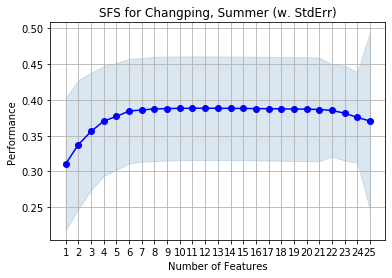

In [57]:
# Changping, Summer:
X = summer.loc['Changping'].values[:,6:31] # note we are excluding PM10
y = summer.loc['Changping'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Changping, Summer (w. StdErr)')
plt.grid()
plt.show()

16    0.389083
17    0.388986
15    0.388982
18    0.388812
14    0.388702
19     0.38835
13    0.388247
20    0.387868
12     0.38765
21    0.387156
11    0.387007
10    0.386369
22    0.386228
23    0.386228
9     0.385764
8      0.38517
24     0.38369
7      0.38332
6     0.381436
5     0.378376
4     0.375555
25    0.366074
3     0.349839
2     0.335671
1     0.164465
Name: avg_score, dtype: object


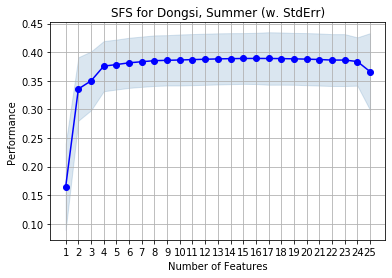

In [58]:
# Dongsi, Summer:
X = summer.loc['Dongsi'].values[:,6:31] # note we are excluding PM10
y = summer.loc['Dongsi'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Dongsi, Summer (w. StdErr)')
plt.grid()
plt.show()

8     0.456739
7     0.456721
9      0.45671
10    0.456666
6     0.456659
11    0.456559
12    0.456449
13    0.456332
14    0.456063
5      0.45576
15    0.455745
16    0.455407
17    0.455173
18    0.454639
4      0.45456
19    0.453997
20    0.453598
21    0.452256
22    0.452256
23    0.450842
24    0.449244
25     0.44668
3     0.396893
2     0.330771
1     0.261278
Name: avg_score, dtype: object


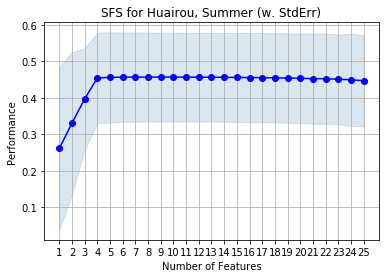

In [59]:
# Huairou, Summer:
X = summer.loc['Huairou'].values[:,6:31] # note we are excluding PM10
y = summer.loc['Huairou'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Huairou, Summer (w. StdErr)')
plt.grid()
plt.show()

### Feature Selection on `fall` data for each station.

11    0.621694
12    0.621691
13    0.621661
10    0.621605
14     0.62159
15    0.621514
16    0.621441
17    0.621385
18    0.621334
9     0.621161
19    0.621139
20    0.620803
8     0.620522
21    0.620294
7     0.619617
22    0.619598
6     0.618841
23    0.618735
24    0.618735
5     0.617729
25    0.617067
4     0.616053
3       0.6023
2     0.553133
1     0.474428
Name: avg_score, dtype: object


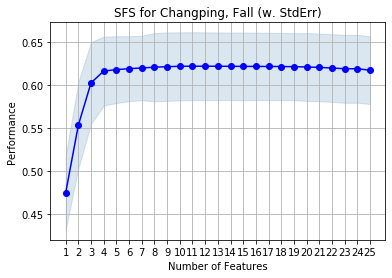

In [60]:
# Changping, Fall:
X = fall.loc['Changping'].values[:,6:31] # note we are excluding PM10
y = fall.loc['Changping'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Changping, Fall (w. StdErr)')
plt.grid()
plt.show()

23    0.740517
24    0.739588
6     0.738458
7     0.738443
8     0.738403
5     0.738386
9     0.738361
10    0.738295
11    0.738239
12    0.738176
4     0.738171
13    0.738095
14    0.738019
15    0.737894
16    0.737758
17    0.737589
18    0.737324
3     0.737208
19    0.737046
25    0.736574
20    0.736568
21    0.736568
22     0.73531
2     0.694425
1      0.61278
Name: avg_score, dtype: object


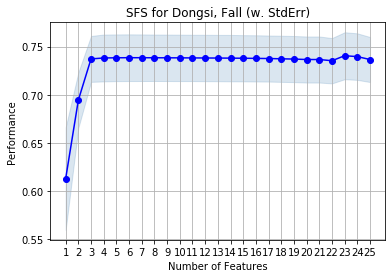

In [61]:
# Dongsi, Fall:
X = fall.loc['Dongsi'].values[:,6:31] # note we are excluding PM10
y = fall.loc['Dongsi'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Dongsi, Fall (w. StdErr)')
plt.grid()
plt.show()

12    0.702257
11    0.702235
13    0.702221
14    0.702188
10    0.702184
15     0.70214
16    0.702099
9     0.702094
17    0.702016
18    0.701932
8      0.70187
19    0.701841
20    0.701727
21    0.701596
7     0.701553
22    0.701387
24    0.701067
23    0.701067
6     0.700975
25    0.700172
5     0.699802
4      0.69645
3     0.692203
2     0.681058
1     0.653765
Name: avg_score, dtype: object


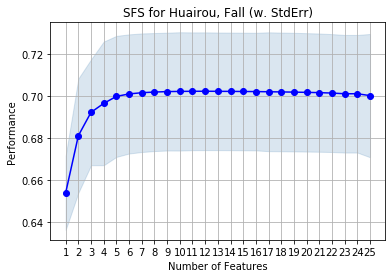

In [62]:
# Huairou, Fall:
X = fall.loc['Huairou'].values[:,6:31] # note we are excluding PM10
y = fall.loc['Huairou'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Huairou, Fall (w. StdErr)')
plt.grid()
plt.show()

### Feature Selection on `winter` data for each station.

10    0.695743
9     0.695686
11    0.695667
8      0.69563
12    0.695556
13    0.695421
7       0.6954
14    0.695249
6     0.695171
15    0.695034
5     0.694778
16    0.694776
17     0.69453
18    0.694282
19    0.693916
20    0.693466
21    0.692471
22    0.692213
24    0.691014
23    0.691014
25    0.688705
4     0.670453
3     0.661253
2     0.651059
1      0.61207
Name: avg_score, dtype: object


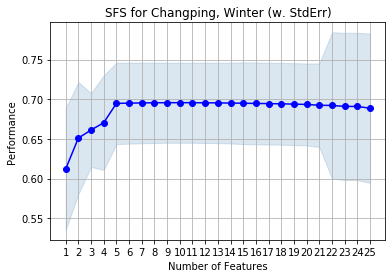

In [63]:
# Changping, Winter:
X = winter.loc['Changping'].values[:,6:31] # note we are excluding PM10
y = winter.loc['Changping'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Changping, Winter (w. StdErr)')
plt.grid()
plt.show()

11    0.734175
10    0.734165
12    0.734163
13    0.734124
14    0.734076
9      0.73406
15    0.734022
8     0.733966
16     0.73396
17    0.733857
7     0.733766
18    0.733739
19    0.733628
20    0.733506
6     0.733405
21    0.733246
22    0.732917
23     0.73239
24     0.73239
5     0.731979
4     0.730527
3     0.729564
25    0.719305
2     0.705228
1     0.658123
Name: avg_score, dtype: object


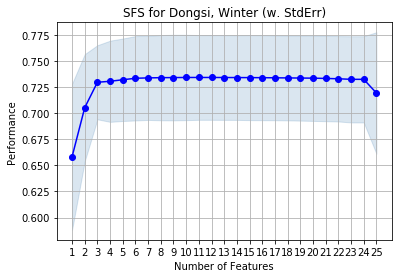

In [64]:
# Dongsi, Winter:
X = winter.loc['Dongsi'].values[:,6:31] # note we are excluding PM10
y = winter.loc['Dongsi'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Dongsi, Winter (w. StdErr)')
plt.grid()
plt.show()

9     0.757496
8     0.757489
7     0.757481
10    0.757473
6     0.757463
11    0.757448
12    0.757421
5     0.757408
13    0.757372
14    0.757312
15    0.757232
16    0.757159
17    0.757029
4     0.756986
18     0.75692
19    0.756741
20    0.756433
21    0.755656
22    0.755656
23    0.753479
24    0.750315
3     0.750192
2     0.744852
25    0.736753
1      0.71873
Name: avg_score, dtype: object


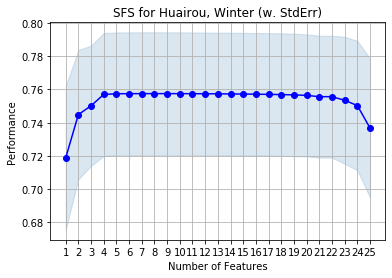

In [65]:
# Huairou, Winter:
X = winter.loc['Huairou'].values[:,6:31] # note we are excluding PM10
y = winter.loc['Huairou'].values[:,4].ravel() 
lr = LinearRegression()
sfsfit = sfs(lr,
          k_features=25,
          forward=True,
          floating=False,
          verbose=0,
          scoring='r2',
          cv=5).fit(X, y)
print(pd.DataFrame.from_dict(sfsfit.get_metric_dict()).T.avg_score.sort_values(ascending=False))
fig = plot_sfs(sfsfit.get_metric_dict(), kind='std_err')
plt.title('SFS for Huairou, Winter (w. StdErr)')
plt.grid()
plt.show()

**After performing Sequential Feature Selection, we see that for each season, the $R^2$ does not differ that much after around 5 features, thus, we will include `SO2`, `NO2`, `CO`, `O3`, `TEMP`, `PRES`, `DEWP` , `RAIN`, `WSPM`, and `wd` in the OLS regression model in order to gain more insight from all the variables**

### Next, we will fit our seasonal regression model using these ten selected features.

In [66]:
# Define regression formula
formula = 'PM2_5 ~ SO2 + NO2 + CO + O3 + TEMP + PRES + DEWP + RAIN + WSPM + wd - 1'

**We will seperate  our data into 12 groups, for each station and each season.**

In [67]:
# seperate data into 3 regions:
changping = data.loc['Changping']
dongsi = data.loc['Dongsi']
huairou = data.loc['Huairou']

In [68]:
# break down further into 12 data sets
chp_spr = changping.loc[changping.season == 'Spring'].rename(columns={'PM2.5':'PM2_5'})
chp_su =changping.loc[changping.season == 'Summer'].rename(columns={'PM2.5':'PM2_5'})
chp_fa = changping.loc[changping.season == 'Fall'].rename(columns={'PM2.5':'PM2_5'})
chp_win = changping.loc[changping.season == 'Winter'].rename(columns={'PM2.5':'PM2_5'})

ds_spr = dongsi.loc[dongsi.season == 'Spring'].rename(columns={'PM2.5':'PM2_5'})
ds_su =dongsi.loc[dongsi.season == 'Summer'].rename(columns={'PM2.5':'PM2_5'})
ds_fa = dongsi.loc[dongsi.season == 'Fall'].rename(columns={'PM2.5':'PM2_5'})
ds_win = dongsi.loc[dongsi.season == 'Winter'].rename(columns={'PM2.5':'PM2_5'})

hr_spr = huairou.loc[huairou.season == 'Spring'].rename(columns={'PM2.5':'PM2_5'})
hr_su =huairou.loc[huairou.season == 'Summer'].rename(columns={'PM2.5':'PM2_5'})
hr_fa = huairou.loc[huairou.season == 'Fall'].rename(columns={'PM2.5':'PM2_5'})
hr_win = huairou.loc[huairou.season == 'Winter'].rename(columns={'PM2.5':'PM2_5'})

### Fit OLS regression  for Changping for all seasons

In [69]:
oslm_chp_spr = smf.ols(formula=formula, data=chp_spr.iloc[:,4:32]).fit().summary()
oslm_chp_su = smf.ols(formula=formula, data=chp_su.iloc[:,4:32]).fit().summary()
oslm_chp_fa = smf.ols(formula=formula, data=chp_fa.iloc[:,4:32]).fit().summary()
oslm_chp_win = smf.ols(formula=formula, data=chp_win.iloc[:,4:32]).fit().summary()

In [70]:
print(oslm_chp_spr) #Changping, Spring

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.686
Model:                            OLS   Adj. R-squared:                  0.685
Method:                 Least Squares   F-statistic:                     802.6
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44427.
No. Observations:                8832   AIC:                         8.890e+04
Df Residuals:                    8807   BIC:                         8.908e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        -90.0422     74.053     -1.216      0.2

In [71]:
print(oslm_chp_su) #Changping, Summer

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.487
Model:                            OLS   Adj. R-squared:                  0.486
Method:                 Least Squares   F-statistic:                     348.9
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44324.
No. Observations:                8832   AIC:                         8.870e+04
Df Residuals:                    8807   BIC:                         8.888e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        410.9889    104.475      3.934      0.0

In [72]:
print(oslm_chp_fa) #Changping, Fall

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.645
Model:                            OLS   Adj. R-squared:                  0.644
Method:                 Least Squares   F-statistic:                     659.0
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -45123.
No. Observations:                8736   AIC:                         9.030e+04
Df Residuals:                    8711   BIC:                         9.047e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]       -294.7026    103.377     -2.851      0.0

In [73]:
print(oslm_chp_win) #Changping, Winter

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.812
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     1560.
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44324.
No. Observations:                8664   AIC:                         8.870e+04
Df Residuals:                    8639   BIC:                         8.887e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        685.7037     86.707      7.908      0.0

**From the OLS Regression Results of Changping we can see that winter has highest R-squared which is 0.812, R- squared in summer is 0.487 which is lowest, because PM2.5 is higher in winter than summer.**

**For spring of Changping, the p values of wd are large than 0.05, so wd is not significant, and pressure also is not significant because it's p value large than 0.05. The coefficient of Rain and Temp are negative.**

**For summer of Changping, all of the varibles p values are smaller than 0.05, so all variables are significant. However, the coefficients of wd are large positive number, so wd has importance effect in summer, especially wd(E). Temp, Rain and pres have negative coefficients.**

**For Fall of Changping, all of the varibles p values are smaller than 0.05, so all variables are significant. However, wd has large negative coefficient, so wd increase will decrease PM2.5. Rain and Temp are negativ.e**

**For winter of Changping, p value of Rain is large than 0.05, so Rain is not significant, this situation matches reality, because It hardly rains in winter of Beijing. the coefficients of wd are large positive number, but Temp Rain and pres have negative coefficients.** --Mary

### Fit OLS regression  for Dongsi for all seasons

In [74]:
oslm_ds_spr = smf.ols(formula=formula, data=ds_spr.iloc[:,4:32]).fit().summary()
oslm_ds_su = smf.ols(formula=formula, data=ds_su.iloc[:,4:32]).fit().summary()
oslm_ds_fa = smf.ols(formula=formula, data=ds_fa.iloc[:,4:32]).fit().summary()
oslm_ds_win = smf.ols(formula=formula, data=ds_win.iloc[:,4:32]).fit().summary()

In [75]:
print(oslm_ds_spr) #Dongsi, Spring

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.652
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     688.4
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -45593.
No. Observations:                8832   AIC:                         9.124e+04
Df Residuals:                    8807   BIC:                         9.141e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]       -106.9151     85.879     -1.245      0.2

In [76]:
print(oslm_ds_su) #Dongsi, Summer

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.474
Model:                            OLS   Adj. R-squared:                  0.472
Method:                 Least Squares   F-statistic:                     330.5
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -45155.
No. Observations:                8832   AIC:                         9.036e+04
Df Residuals:                    8807   BIC:                         9.054e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]       -192.3506    114.649     -1.678      0.0

In [77]:
print(oslm_ds_fa) #Dongsi, Fall

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.770
Model:                            OLS   Adj. R-squared:                  0.769
Method:                 Least Squares   F-statistic:                     1216.
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44958.
No. Observations:                8736   AIC:                         8.997e+04
Df Residuals:                    8711   BIC:                         9.014e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        150.0877    100.954      1.487      0.1

In [78]:
print(oslm_ds_win) #Dongsi, Winter

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.787
Model:                            OLS   Adj. R-squared:                  0.786
Method:                 Least Squares   F-statistic:                     1330.
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -46866.
No. Observations:                8664   AIC:                         9.378e+04
Df Residuals:                    8639   BIC:                         9.396e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]       1143.7816    117.820      9.708      0.0

**From the OLS Regression Results of Dongsi we can see that winter has highest R-squared which is 0.787, summer has lowest -- 0.487.**

**For spring of Dongsi, the p values of wd and pres are large than 0.05, so wd and pres are not significant. The coefficient of Rain and Temp are negative.**

**For summer of Dongsi, the p values of wd and pres are large than 0.05, so wd and pres are not significant. Rain has negative coefficients.**

**For Fall of Dongsi, the p value of wd is large than 0.05, so so wd is not significant. The coefficient of Rain ,pres and Temp are negative coefficients.**

**For Fall of Dongsi, all varaibles are significant, wd has large positive coefficient. Temp, Rain and Pres have neative coefficients.** --Mary

## Fit OLS regression  for Huairou for all seasons

In [79]:
oslm_hr_spr = smf.ols(formula=formula, data=hr_spr.iloc[:,4:32]).fit().summary()
oslm_hr_su = smf.ols(formula=formula, data=hr_su.iloc[:,4:32]).fit().summary()
oslm_hr_fa = smf.ols(formula=formula, data=hr_fa.iloc[:,4:32]).fit().summary()
oslm_hr_win = smf.ols(formula=formula, data=hr_win.iloc[:,4:32]).fit().summary()

In [80]:
print(oslm_hr_spr) #Huairou, Spring

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.690
Model:                            OLS   Adj. R-squared:                  0.690
Method:                 Least Squares   F-statistic:                     818.4
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44309.
No. Observations:                8832   AIC:                         8.867e+04
Df Residuals:                    8807   BIC:                         8.884e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        129.0266     73.196      1.763      0.0

In [81]:
print(oslm_hr_su) #Huairou, Summer

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.572
Model:                            OLS   Adj. R-squared:                  0.571
Method:                 Least Squares   F-statistic:                     490.0
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -43256.
No. Observations:                8832   AIC:                         8.656e+04
Df Residuals:                    8807   BIC:                         8.674e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]       -573.1346     90.606     -6.326      0.0

In [82]:
print(oslm_hr_fa) #Huairou, Fall

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.721
Model:                            OLS   Adj. R-squared:                  0.721
Method:                 Least Squares   F-statistic:                     939.3
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -43973.
No. Observations:                8736   AIC:                         8.800e+04
Df Residuals:                    8711   BIC:                         8.817e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        -34.8686     85.399     -0.408      0.6

In [83]:
print(oslm_hr_win) #Huairou, Winter

                            OLS Regression Results                            
Dep. Variable:                  PM2_5   R-squared:                       0.807
Model:                            OLS   Adj. R-squared:                  0.807
Method:                 Least Squares   F-statistic:                     1509.
Date:                Sun, 01 Dec 2019   Prob (F-statistic):               0.00
Time:                        16:44:44   Log-Likelihood:                -44243.
No. Observations:                8664   AIC:                         8.854e+04
Df Residuals:                    8639   BIC:                         8.871e+04
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
wd[E]        380.7466     84.117      4.526      0.0

**From the OLS Regression Results of Huairou we can see that winter has highest R-squared which is 0.807, summer has lowest -- 0.572**

**For spring of Huairou, the p values of wd are large than 0.05, so wd is not significant. SO2, Temp, pres and Rain have negative coefficients.**

**For summer of Huairou, Rain is not significant because p value is large than 0.05. wd has large negative coefficient.**

**For Fall of Huairou, wd and pres are not significant because p values are large than 0.05. SO2,Temp,Rain have negative coefficients.**

**For winter of Huairou, Rain is not significant because p value is large than 0.05,wd has large positive coefficient. Temp and pres have negative coefficients.** --Mary

**For all the three different Districts in Beijing, R-squared shows seasonal trend matches PM2.5 trend which is high in winter and low in summer.**

## Gradient Boosting (GBM)
**Next, we will try Gradient Boosting (GBM) and see which variables are more important for prediction of `PM2.5`.**

In [84]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import classification_report
from sklearn.model_selection import learning_curve, GridSearchCV

This is how we tune the parameters which we will be using in the below `GradientBoostingRegressor`.

(We will just use Changping's Spring data for fast tuning)

First, we tune `learning_rate` and `n_estimators`:

    p_test1 = {'learning_rate': [0.01, 0.03, 0.05, 0.1], 'n_estimators':[10000,30000, 50000]}

    tuning = GridSearchCV(estimator=GradientBoostingRegressor(max_depth=4, min_samples_split=2, min_samples_leaf=1, subsample=1, max_features='sqrt', random_state=1), param_grid=p_test1, scoring='r2', iid=False, cv=5)
    tuning.fit(X_train_spr, y_train_spr)
    tuning.best_params_, tuning.best_score_
    
CV gives us the best parameters `learning_rate=0.01` and `n_estimators=10000`.

Next, we tune `max_depth`:

    p_test2 = {'max_depth':[2,4,6,8,10,12] }
    tuning = GridSearchCV(estimator=GradientBoostingRegressor(learning_rate=0.01, n_estimators=10000, min_samples_split=2, min_samples_leaf=1, subsample=1, max_features='sqrt', random_state=1), param_grid=p_test2, scoring='r2', iid=False, cv=5)
    tuning.fit(X_train_spr, y_train_spr)
    tuning.best_params_, tuning.best_score_

CV gives us the best parameters `max_depth=10`.

Then, we tune `min_samples_split` and `min_samples_leaf`:

    p_test3 = {'min_samples_split':[2,4,6,8], 'min_samples_leaf':[1,3,5,7]}
    tuning = GridSearchCV(estimator=GradientBoostingRegressor(learning_rate=0.01, n_estimators=10000, max_depth=10, subsample=1, max_features='sqrt', random_state=1), param_grid=p_test3, scoring='r2', iid=False, cv=5)
    tuning.fit(X_train_spr, y_train_spr)
    tuning.best_params_, tuning.best_score_

CV gives us the best parameters `min_samples_split=2` and `min_samples_leaf=5` and yields $R^2=0.8319670932863257$.

## Now we fit `gbm` to the four seasons of Changping.
## (Do not run these if your computer is slow, just look the outputs)

0.8356382495931237
CO      0.342932
SO2     0.169576
NO2     0.141631
DEWP    0.124994
PRES    0.058868
O3      0.055629
TEMP    0.050499
WSPM    0.031245
RAIN    0.005717
ESE     0.003134
SE      0.001887
SSE     0.001587
NNW     0.001583
NW      0.001575
N       0.001475
W       0.001370
E       0.001207
WNW     0.001187
ENE     0.001118
S       0.000861
NNE     0.000546
SSW     0.000472
SW      0.000375
WSW     0.000276
NE      0.000255
dtype: float64


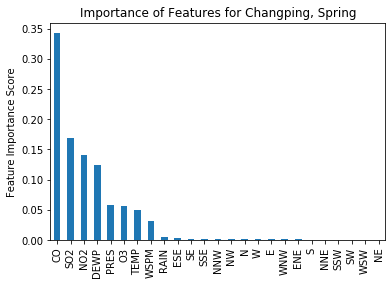

In [85]:
# For Changping, Spring
X_train_spr, X_test_spr, y_train_spr, y_test_spr = train_test_split(
    spring.loc['Changping'].iloc[:,6:31], # note we are excluding PM10
    spring.loc['Changping'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_spr = y_train_spr.ravel()
y_test_spr = y_test_spr.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_spr, y_train_spr)
predictors=list(X_train_spr)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Changping, Spring')
plt.ylabel('Feature Importance Score')
chp_spr_r2 = model_gbm.score(X_test_spr, y_test_spr)
print(chp_spr_r2) #the r^2 for this model
chp_spr_fi = feat_imp
print(chp_spr_fi) #the important features

0.7296657729263121
CO      0.403060
DEWP    0.176940
SO2     0.079329
O3      0.068478
NO2     0.067753
PRES    0.064887
TEMP    0.057983
WSPM    0.029687
E       0.011991
RAIN    0.009001
ESE     0.008112
N       0.003573
NW      0.003286
ENE     0.002893
NNW     0.002409
SSE     0.002147
SE      0.002037
S       0.001364
WNW     0.001251
W       0.000806
SSW     0.000745
NNE     0.000728
SW      0.000699
NE      0.000585
WSW     0.000256
dtype: float64


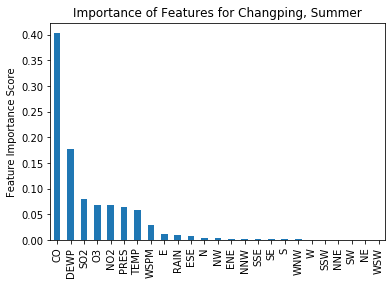

In [86]:
# For Changping, Summer
X_train_su, X_test_su, y_train_su, y_test_su = train_test_split(
    summer.loc['Changping'].iloc[:,6:31], # note we are excluding PM10
    summer.loc['Changping'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_su = y_train_su.ravel()
y_test_su = y_test_su.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_su, y_train_su)
predictors=list(X_train_su)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Changping, Summer')
plt.ylabel('Feature Importance Score')
chp_su_r2 = model_gbm.score(X_test_su, y_test_su)
print(chp_su_r2) #Returns the coefficient of determination R^2 of the prediction
chp_su_fi = feat_imp
print(chp_su_fi) #the important features

0.8698495599666035
CO      0.376069
NO2     0.233673
DEWP    0.103364
PRES    0.064454
O3      0.061389
SO2     0.058206
TEMP    0.054540
WSPM    0.026512
RAIN    0.005210
ESE     0.003166
NNW     0.002466
NW      0.001786
E       0.001638
N       0.001572
WNW     0.001018
NNE     0.000949
SE      0.000793
S       0.000623
SSE     0.000620
NE      0.000608
ENE     0.000510
W       0.000320
SW      0.000212
WSW     0.000162
SSW     0.000141
dtype: float64


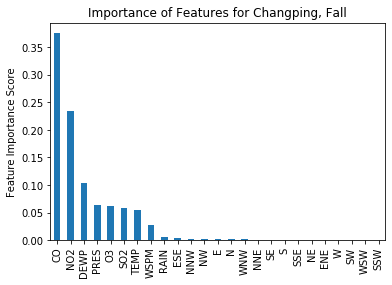

In [87]:
# For Changping, Fall
X_train_fa, X_test_fa, y_train_fa, y_test_fa = train_test_split(
    fall.loc['Changping'].iloc[:,6:31], # note we are excluding PM10
    fall.loc['Changping'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_fa = y_train_fa.ravel()
y_test_fa = y_test_fa.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_fa, y_train_fa)
predictors=list(X_train_fa)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Changping, Fall')
plt.ylabel('Feature Importance Score')
chp_fa_r2 = model_gbm.score(X_test_fa, y_test_fa)
print(chp_fa_r2) #the r^2 for this model
chp_fa_fi = feat_imp
print(chp_fa_fi) #the important features

0.9290354862393014
CO      0.323404
NO2     0.244727
DEWP    0.146943
O3      0.095979
SO2     0.084781
PRES    0.036446
WSPM    0.033647
TEMP    0.021542
ESE     0.002189
WNW     0.001933
NW      0.001318
E       0.001169
NNW     0.000900
N       0.000795
SE      0.000567
SSW     0.000534
W       0.000482
SSE     0.000450
NE      0.000394
SW      0.000387
S       0.000365
ENE     0.000331
RAIN    0.000289
NNE     0.000222
WSW     0.000204
dtype: float64


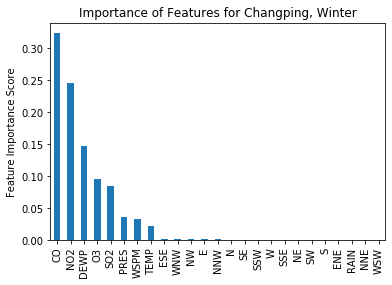

In [88]:
# For Changping, Winter
X_train_win, X_test_win, y_train_win, y_test_win = train_test_split(
    winter.loc['Changping'].iloc[:,6:31], # note we are excluding PM10
    winter.loc['Changping'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_win = y_train_win.ravel()
y_test_win = y_test_win.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_win, y_train_win)
predictors=list(X_train_win)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Changping, Winter')
plt.ylabel('Feature Importance Score')
chp_win_r2 = model_gbm.score(X_test_win, y_test_win)
print(chp_win_r2) #the r^2 for this model
chp_win_fi = feat_imp
print(chp_win_fi) #the important features

## `gbm` for the four seasons of Dongsi.

0.8123344400670982
CO      0.299399
SO2     0.198033
NO2     0.189554
DEWP    0.097775
O3      0.057138
PRES    0.056336
TEMP    0.051456
WSPM    0.026874
RAIN    0.002484
ESE     0.002260
E       0.002084
SSW     0.001867
SE      0.001657
NW      0.001510
SSE     0.001427
WSW     0.001321
ENE     0.001280
NNW     0.001274
S       0.001220
NE      0.001165
SW      0.001104
W       0.000794
WNW     0.000757
N       0.000739
NNE     0.000491
dtype: float64


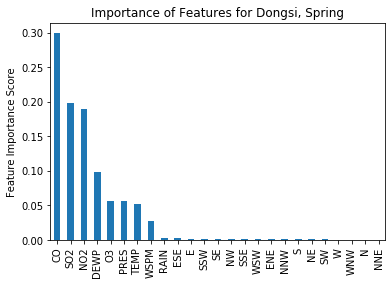

In [89]:
# For Dongsi, Spring
X_train_spr, X_test_spr, y_train_spr, y_test_spr = train_test_split(
    spring.loc['Dongsi'].iloc[:,6:31], # note we are excluding PM10
    spring.loc['Dongsi'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_spr = y_train_spr.ravel()
y_test_spr = y_test_spr.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_spr, y_train_spr)
predictors=list(X_train_spr)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Dongsi, Spring')
plt.ylabel('Feature Importance Score')
ds_spr_r2 = model_gbm.score(X_test_spr, y_test_spr)
print(ds_spr_r2) #the r^2 for this model
ds_spr_fi = feat_imp
print(ds_spr_fi) #the important features

0.7821090171008895
CO      0.323429
DEWP    0.194471
SO2     0.144842
NO2     0.080873
O3      0.072262
PRES    0.067790
TEMP    0.050713
WSPM    0.028919
RAIN    0.005309
ESE     0.004728
E       0.002632
NW      0.002559
SSE     0.002400
N       0.002269
SE      0.002255
S       0.002006
SSW     0.001940
ENE     0.001919
NE      0.001758
SW      0.001667
NNW     0.001592
NNE     0.001218
WSW     0.001098
WNW     0.000942
W       0.000408
dtype: float64


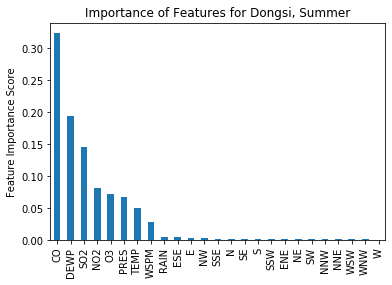

In [90]:
# For Dongsi, Summer
X_train_su, X_test_su, y_train_su, y_test_su = train_test_split(
    summer.loc['Dongsi'].iloc[:,6:31], # note we are excluding PM10
    summer.loc['Dongsi'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_su = y_train_su.ravel()
y_test_su = y_test_su.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_su, y_train_su)
predictors=list(X_train_su)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Dongsi, Summer')
plt.ylabel('Feature Importance Score')
ds_su_r2 = model_gbm.score(X_test_su, y_test_su)
print(ds_su_r2) #Returns the coefficient of determination R^2 of the prediction
ds_su_fi = feat_imp
print(ds_su_fi) #the important features

0.8998711646663512
CO      0.364385
NO2     0.269789
SO2     0.112006
DEWP    0.072272
TEMP    0.046876
O3      0.046429
PRES    0.038965
WSPM    0.032255
RAIN    0.003401
ENE     0.002138
NE      0.001335
ESE     0.001258
NW      0.001253
E       0.001050
NNE     0.000857
SE      0.000801
WSW     0.000654
SW      0.000641
SSW     0.000637
WNW     0.000627
NNW     0.000548
SSE     0.000526
S       0.000523
N       0.000487
W       0.000286
dtype: float64


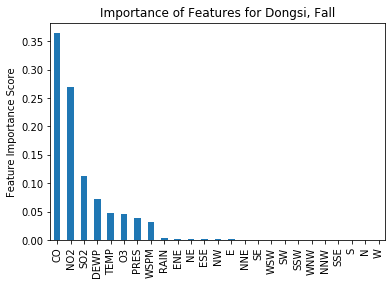

In [91]:
# For Dongsi, Fall
X_train_fa, X_test_fa, y_train_fa, y_test_fa = train_test_split(
    fall.loc['Dongsi'].iloc[:,6:31], # note we are excluding PM10
    fall.loc['Dongsi'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_fa = y_train_fa.ravel()
y_test_fa = y_test_fa.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_fa, y_train_fa)
predictors=list(X_train_fa)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Dongsi, Fall')
plt.ylabel('Feature Importance Score')
ds_fa_r2 = model_gbm.score(X_test_fa, y_test_fa)
print(ds_fa_r2) #the r^2 for this model
ds_fa_fi = feat_imp
print(ds_fa_fi) #the important features

0.9334932026034085
CO      0.335619
NO2     0.189560
DEWP    0.167504
SO2     0.145605
O3      0.064303
PRES    0.033889
WSPM    0.025810
TEMP    0.022414
NNW     0.002527
E       0.002324
NE      0.001815
NW      0.001764
ENE     0.001010
ESE     0.000894
WSW     0.000813
RAIN    0.000811
SW      0.000642
N       0.000589
SE      0.000519
NNE     0.000317
SSW     0.000300
WNW     0.000294
SSE     0.000253
S       0.000233
W       0.000193
dtype: float64


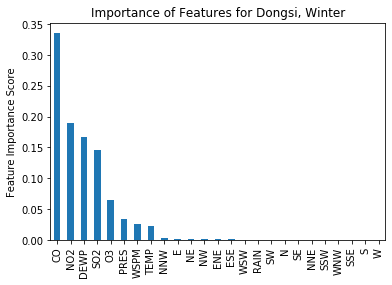

In [92]:
# For Changping, Winter
X_train_win, X_test_win, y_train_win, y_test_win = train_test_split(
    winter.loc['Dongsi'].iloc[:,6:31], # note we are excluding PM10
    winter.loc['Dongsi'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_win = y_train_win.ravel()
y_test_win = y_test_win.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_win, y_train_win)
predictors=list(X_train_win)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Dongsi, Winter')
plt.ylabel('Feature Importance Score')
ds_win_r2 = model_gbm.score(X_test_win, y_test_win)
print(ds_win_r2) #the r^2 for this model
ds_win_fi = feat_imp
print(ds_win_fi) #the important features

## `gbm` for the four seasons of Huairou

0.8697931780904341
CO      0.389787
NO2     0.177129
SO2     0.129496
DEWP    0.110126
O3      0.051441
TEMP    0.047437
PRES    0.047387
WSPM    0.025537
RAIN    0.005679
NW      0.002219
WNW     0.001960
S       0.001487
SSE     0.001483
W       0.001418
SW      0.001162
SE      0.000958
WSW     0.000862
ENE     0.000752
ESE     0.000657
NE      0.000534
N       0.000520
E       0.000518
SSW     0.000503
NNW     0.000489
NNE     0.000459
dtype: float64


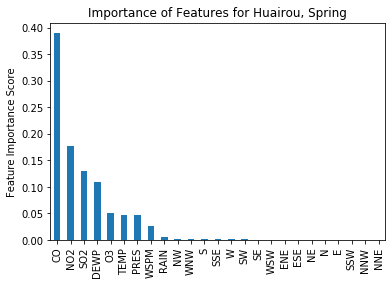

In [93]:
# For Huairou, Spring
X_train_spr, X_test_spr, y_train_spr, y_test_spr = train_test_split(
    spring.loc['Huairou'].iloc[:,6:31], # note we are excluding PM10
    spring.loc['Huairou'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_spr = y_train_spr.ravel()
y_test_spr = y_test_spr.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_spr, y_train_spr)
predictors=list(X_train_spr)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Huairou, Spring')
plt.ylabel('Feature Importance Score')
hr_spr_r2 = model_gbm.score(X_test_spr, y_test_spr)
print(hr_spr_r2) #the r^2 for this model
hr_spr_fi = feat_imp
print(hr_spr_fi) #the important features

0.83138452872731
CO      0.454590
DEWP    0.155472
NO2     0.106226
SO2     0.073735
O3      0.061385
TEMP    0.055826
PRES    0.048138
WSPM    0.022382
RAIN    0.005660
NW      0.001848
WNW     0.001820
ESE     0.001404
W       0.001284
SW      0.001173
E       0.001154
SSE     0.001121
WSW     0.001017
NE      0.001017
ENE     0.000939
SE      0.000905
NNE     0.000721
SSW     0.000600
N       0.000579
NNW     0.000502
S       0.000502
dtype: float64


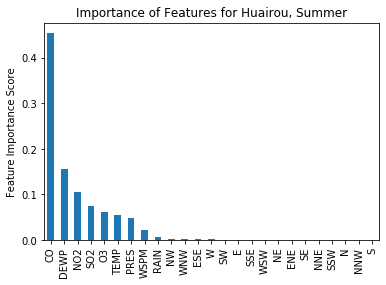

In [94]:
# For Huairou, Summer
X_train_su, X_test_su, y_train_su, y_test_su = train_test_split(
    summer.loc['Huairou'].iloc[:,6:31], # note we are excluding PM10
    summer.loc['Huairou'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_su = y_train_su.ravel()
y_test_su = y_test_su.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_su, y_train_su)
predictors=list(X_train_su)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Huairou, Summer')
plt.ylabel('Feature Importance Score')
hr_su_r2 = model_gbm.score(X_test_su, y_test_su)
print(hr_su_r2) #Returns the coefficient of determination R^2 of the prediction
hr_su_fi = feat_imp
print(hr_su_fi) #the important features

0.8999178580559711
CO      0.497652
NO2     0.151782
DEWP    0.091043
O3      0.067523
SO2     0.061147
TEMP    0.047748
PRES    0.042736
WSPM    0.021302
RAIN    0.006184
NW      0.002616
WNW     0.001871
W       0.001156
N       0.000865
SE      0.000837
WSW     0.000657
ESE     0.000604
SSW     0.000589
SW      0.000550
NE      0.000528
E       0.000524
SSE     0.000469
ENE     0.000455
NNE     0.000399
NNW     0.000395
S       0.000367
dtype: float64


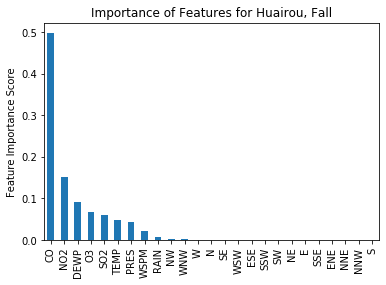

In [95]:
# For Huairou, Fall
X_train_fa, X_test_fa, y_train_fa, y_test_fa = train_test_split(
    fall.loc['Huairou'].iloc[:,6:31], # note we are excluding PM10
    fall.loc['Huairou'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_fa = y_train_fa.ravel()
y_test_fa = y_test_fa.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_fa, y_train_fa)
predictors=list(X_train_fa)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Huairou, Fall')
plt.ylabel('Feature Importance Score')
hr_fa_r2 = model_gbm.score(X_test_fa, y_test_fa)
print(hr_fa_r2) #the r^2 for this model
hr_fa_fi = feat_imp
print(hr_fa_fi) #the important features

0.9224417681710841
CO      0.387061
NO2     0.213219
DEWP    0.168763
O3      0.077446
SO2     0.064176
PRES    0.031867
TEMP    0.028904
WSPM    0.018818
NW      0.002553
WNW     0.001196
ENE     0.000855
SSE     0.000531
ESE     0.000502
SE      0.000498
SW      0.000480
NNW     0.000468
E       0.000440
RAIN    0.000439
WSW     0.000408
W       0.000392
NE      0.000354
NNE     0.000267
N       0.000161
S       0.000101
SSW     0.000100
dtype: float64


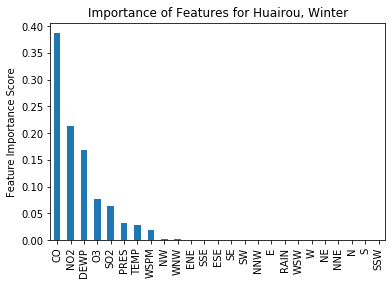

In [96]:
# For Huairou, Winter
X_train_win, X_test_win, y_train_win, y_test_win = train_test_split(
    winter.loc['Huairou'].iloc[:,6:31], # note we are excluding PM10
    winter.loc['Huairou'].iloc[:,4], # 4th column is PM2.5
    test_size = 1/3,
    random_state=1)
y_train_win = y_train_win.ravel()
y_test_win = y_test_win.ravel()
model_gbm = GradientBoostingRegressor(learning_rate=0.01, 
                                     n_estimators=10000,
                                     max_depth=10, 
                                     min_samples_split=2, 
                                     min_samples_leaf=5, 
                                     subsample=1,
                                     max_features=6, 
                                     random_state=1)
model_gbm.fit(X_train_win, y_train_win)
predictors=list(X_train_win)
feat_imp = pd.Series(model_gbm.feature_importances_, predictors).sort_values(ascending=False)
feat_imp.plot(kind='bar', title='Importance of Features for Huairou, Winter')
plt.ylabel('Feature Importance Score')
hr_win_r2 = model_gbm.score(X_test_win, y_test_win)
print(hr_win_r2) #the r^2 for this model
hr_win_fi = feat_imp
print(hr_win_fi) #the important features

## Summary of the Feature Importance for each station

        Spring    Summer      Fall    Winter
CO    0.342932  0.403060  0.376069  0.323404
DEWP  0.124994  0.176940  0.103364  0.146943
E     0.001207  0.011991  0.001638  0.001169
ENE   0.001118  0.002893  0.000510  0.000331
ESE   0.003134  0.008112  0.003166  0.002189
N     0.001475  0.003573  0.001572  0.000795
NE    0.000255  0.000585  0.000608  0.000394
NNE   0.000546  0.000728  0.000949  0.000222
NNW   0.001583  0.002409  0.002466  0.000900
NO2   0.141631  0.067753  0.233673  0.244727
NW    0.001575  0.003286  0.001786  0.001318
O3    0.055629  0.068478  0.061389  0.095979
PRES  0.058868  0.064887  0.064454  0.036446
RAIN  0.005717  0.009001  0.005210  0.000289
S     0.000861  0.001364  0.000623  0.000365
SE    0.001887  0.002037  0.000793  0.000567
SO2   0.169576  0.079329  0.058206  0.084781
SSE   0.001587  0.002147  0.000620  0.000450
SSW   0.000472  0.000745  0.000141  0.000534
SW    0.000375  0.000699  0.000212  0.000387
TEMP  0.050499  0.057983  0.054540  0.021542
W     0.00

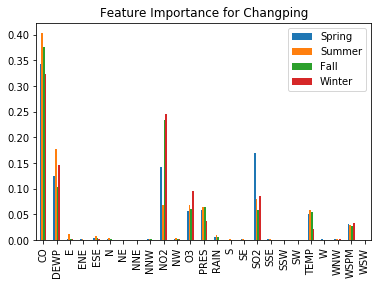

In [97]:
# changping
columns=['Spring', 'Summer', 'Fall', 'Winter']
changping_fi = pd.DataFrame([chp_spr_fi.sort_index(), chp_su_fi.sort_index(), chp_fa_fi.sort_index(), chp_win_fi.sort_index()], index=columns).T
print(changping_fi)
changping_fi.plot(kind='bar',title='Feature Importance for Changping')

        Spring    Summer      Fall    Winter
CO    0.299399  0.323429  0.364385  0.335619
DEWP  0.097775  0.194471  0.072272  0.167504
E     0.002084  0.002632  0.001050  0.002324
ENE   0.001280  0.001919  0.002138  0.001010
ESE   0.002260  0.004728  0.001258  0.000894
N     0.000739  0.002269  0.000487  0.000589
NE    0.001165  0.001758  0.001335  0.001815
NNE   0.000491  0.001218  0.000857  0.000317
NNW   0.001274  0.001592  0.000548  0.002527
NO2   0.189554  0.080873  0.269789  0.189560
NW    0.001510  0.002559  0.001253  0.001764
O3    0.057138  0.072262  0.046429  0.064303
PRES  0.056336  0.067790  0.038965  0.033889
RAIN  0.002484  0.005309  0.003401  0.000811
S     0.001220  0.002006  0.000523  0.000233
SE    0.001657  0.002255  0.000801  0.000519
SO2   0.198033  0.144842  0.112006  0.145605
SSE   0.001427  0.002400  0.000526  0.000253
SSW   0.001867  0.001940  0.000637  0.000300
SW    0.001104  0.001667  0.000641  0.000642
TEMP  0.051456  0.050713  0.046876  0.022414
W     0.00

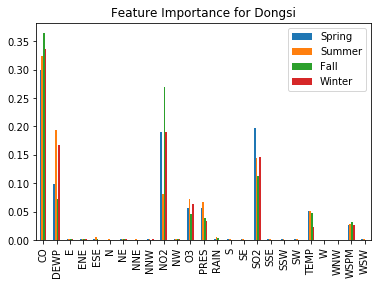

In [98]:
# Dongsi
dongsi_fi = pd.DataFrame([ds_spr_fi.sort_index(), ds_su_fi.sort_index(), ds_fa_fi.sort_index(), ds_win_fi.sort_index()], index=columns).T
print(dongsi_fi)
dongsi_fi.plot(kind='bar',title='Feature Importance for Dongsi')

        Spring    Summer      Fall    Winter
CO    0.389787  0.454590  0.497652  0.387061
DEWP  0.110126  0.155472  0.091043  0.168763
E     0.000518  0.001154  0.000524  0.000440
ENE   0.000752  0.000939  0.000455  0.000855
ESE   0.000657  0.001404  0.000604  0.000502
N     0.000520  0.000579  0.000865  0.000161
NE    0.000534  0.001017  0.000528  0.000354
NNE   0.000459  0.000721  0.000399  0.000267
NNW   0.000489  0.000502  0.000395  0.000468
NO2   0.177129  0.106226  0.151782  0.213219
NW    0.002219  0.001848  0.002616  0.002553
O3    0.051441  0.061385  0.067523  0.077446
PRES  0.047387  0.048138  0.042736  0.031867
RAIN  0.005679  0.005660  0.006184  0.000439
S     0.001487  0.000502  0.000367  0.000101
SE    0.000958  0.000905  0.000837  0.000498
SO2   0.129496  0.073735  0.061147  0.064176
SSE   0.001483  0.001121  0.000469  0.000531
SSW   0.000503  0.000600  0.000589  0.000100
SW    0.001162  0.001173  0.000550  0.000480
TEMP  0.047437  0.055826  0.047748  0.028904
W     0.00

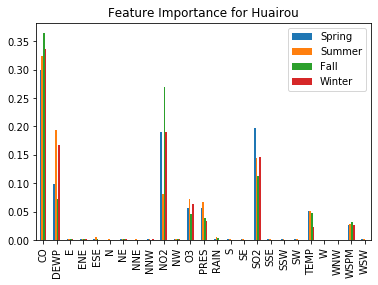

In [99]:
# Huairou
huairou_fi = pd.DataFrame([hr_spr_fi.sort_index(), hr_su_fi.sort_index(), hr_fa_fi.sort_index(), hr_win_fi.sort_index()], index=columns).T
print(huairou_fi)
dongsi_fi.plot(kind='bar',title='Feature Importance for Huairou')

In [100]:
[chp_spr_r2, chp_su_r2, chp_fa_r2, chp_win_r2]

[0.8356382495931237,
 0.7296657729263121,
 0.8698495599666035,
 0.9290354862393014]

## The $R^2$ from CV for each station and season

In [101]:
d = {'Changping':[chp_spr_r2, chp_su_r2, chp_fa_r2, chp_win_r2], 
     'Dongsi':[ds_spr_r2, ds_su_r2, ds_fa_r2, ds_win_r2],
    'Huairou':[hr_spr_r2, hr_su_r2, hr_fa_r2, hr_win_r2]}
pd.DataFrame(data=d,index=columns)

,Changping,Dongsi,Huairou
Spring,0.835638,0.812334,0.869793
Summer,0.729666,0.782109,0.831385
Fall,0.869850,0.899871,0.899918
Winter,0.929035,0.933493,0.922442


### Exaplain above results (both plots and $R^2$) here.

# This is Mary's variable desription:

## CO 

Carbon monoxide is a colorless, odorless, and tasteless flammable gas that is slightly less dense than air.Carbon monoxide consists of one carbon atom and one oxygen atom and it is one of the main atmospheric pollutants.

In [ ]:
x=data[["CO"]]
y=data[["PM2.5"]]
plt.scatter(x,y)
plt.title("CO and PM2.5")
plt.ylabel("PM2.5")
plt.xlabel("CO")
plt.show()

CO and PM2.5 has positive relationship

## PRES

The atmosphere is formed by air and surrounds the Earth, this column measured what’s the weight of air column on each square metre of the Earth's surface corresponding to a pressure ,at sea level is 1013hPa

In [ ]:
x=data[["PRES"]]
y=data[["PM2.5"]]
plt.scatter(x,y,color="red")
plt.title("PRES and PM2.5")
plt.ylabel("PM2.5")
plt.xlabel("PRES")
plt.show()

PRES and PM2.5 shows like normal distribution, with pressure increase or decrease, PM2.5 will decrease.

## RAIN

Rain is liquid water in the form of droplets that have condensed from atmospheric water vapor and then become heavy enough to fall under gravity.

In [ ]:
x=data[["RAIN"]]
y=data[["PM2.5"]]
plt.scatter(x,y,color="green")
plt.title("RAIN and PM2.5")
plt.ylabel("PM2.5")
plt.xlabel("RAIN")
plt.show()

With rain increase, PM2.5 decrease.